# Dependencies

Most of the required libraries are already installed on Google Colab, but for example optuna and evaluate could be missing on older runtime versions.

The transformers library gets new releases so often, that locking its version during the development process decreased the number of breaking changes. Older versions might not work, because an issue with customized model classes extending the BERT sequence classification base class were not working.

In [2]:
!pip install -q optuna evaluate transformers==5.1.0 kaleido==0.2.1

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.3/10.3 MB 128.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 16.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 419.5/419.5 kB 43.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.1/84.1 kB 10.8 MB/s eta 0:00:00


In [3]:
# Have to import this first for plotly PDF exports to work
import kaleido
import plotly
from datasets import concatenate_datasets, load_dataset, DatasetDict, Features, Value, load_from_disk
from transformers import AutoTokenizer, BertModel, AutoModelForSequenceClassification, BertForSequenceClassification, DistilBertForSequenceClassification, DistilBertModel, TrainingArguments, Trainer, PreTrainedConfig, EarlyStoppingCallback, DataCollatorWithPadding, pipeline
from transformers.pipelines.pt_utils import KeyDataset
from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score, classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import numpy as np
import evaluate
import torch.nn as nn
import torch.nn.functional as F
import torch
from torchsummary import summary
import optuna
from dataclasses import dataclass, field
from scipy.stats import wilcoxon, normaltest, ttest_rel
import matplotlib.pyplot as plt
import math
from tqdm.auto import tqdm
import json

In [4]:
if torch.cuda.is_available():
    DEVICE_TYPE = "cuda"
else:
    DEVICE_TYPE = "cpu"

# This should cover most cases where the device would need to be manually set
# This actually breaks daloaders, but only sometimes
torch.set_default_device(DEVICE_TYPE)

print(f"Using {DEVICE_TYPE} device type")

Using cuda device type


# Global variables

In this section a predefined random seed is set, which is used to make dataset preprocessing deterministic, resulting in the same samples ending up in the same split each time the base dataset is loaded. Truly random splits for each new runtime could result in information being leaked from the training set, if for example the emotion detection teacher model were to see samples only present in the test sets used later in model evaluation.

The specifications of the base dataset are defined in a dictionary. A more sophisticated data structure could be used, but for a notebook implentation a dictionary should be sufficient.

The definitions of the target task all the auxiliary tasks is also stored in a dictionary. The auxiliary tasks include a huggingface model identifier and all tasks include label ID to name mapping.

In [10]:
# Useful to get the same samples in the same splits on different executions
RANDOM_SEED = 8953

# Total dataset size and split ratio definition
dataset_specs = {
    "total_samples": 20000,
    "splits": {
        "train": 0.8,
        "validate": 0.1,
        "test": 0.1
    }
}

# Task definitions is one single place
task_definitions = {
    "emotion": {
        "hf_model": None,
        "labels": {
            0: "sadness",
            1: "joy",
            2: "love",
            3: "anger",
            4: "fear",
            5: "surprise"
        }
    },
    "sentiment": {
        # https://huggingface.co/cardiffnlp/twitter-roberta-base-sentiment-latest
        "hf_model": "cardiffnlp/twitter-roberta-base-sentiment-latest",
        "labels": {
            0: "negative",
            1: "neutral",
            2: "positive"
        }
    },
    "sarcasm": {
        # https://huggingface.co/helinivan/english-sarcasm-detector
        "hf_model": "helinivan/english-sarcasm-detector",
        "labels": {
            0: "not sarcastic",
            1: "sarcastic"
        }
    },
    "politeness": {
        # https://huggingface.co/Intel/polite-guard
        "hf_model": "Intel/polite-guard",
        "labels": {
            0: "polite",
            1: "somewhat polite",
            2: "neutral",
            3: "impolite"
        }
    },
    "irony": {
        # https://huggingface.co/cardiffnlp/twitter-roberta-base-irony
        "hf_model": "cardiffnlp/twitter-roberta-base-irony",
        "labels": {
            0: "irony",
            1: "no irony"
        }
    },
    "stress": {
        # https://huggingface.co/dstefa/roberta-base_stress_classification
        "hf_model": "dstefa/roberta-base_stress_classification",
        "labels": {
            0: "not stressed",
            1: "stressed"
        }
    },
    "subjectivity": {
      # https://huggingface.co/GroNLP/mdebertav3-subjectivity-english
      "hf_model": "GroNLP/mdebertav3-subjectivity-english",
      "labels": {
          # Not sure about the order...
          0: "objective",
          1: "subjective"
      }
    },
    "toxicity": {
        # https://huggingface.co/s-nlp/roberta_toxicity_classifier
        "hf_model": "s-nlp/roberta_toxicity_classifier",
        "labels": {
            0: "neutral",
            1: "toxic"
        }
    }
}

# **Load from disk**

To save time and computational resources on training and dataset processing, the emotion dataset with distillation features for all tasks can be loaded from the disk. The same can also be done with the emotion detection teacher model and the final student model. The files of each of them are expetected to be in a zip file for more convenient processing.

In [6]:
# Optionally the dataset with the distillation features can be downloaded from UTU Seafile
!wget -O emotion_dataset.zip https://seafile.utu.fi/seafhttp/f/b4a45a8da6f04dd4831a/?op=view

--2026-05-21 13:07:19--  https://seafile.utu.fi/seafhttp/f/b4a45a8da6f04dd4831a/?op=view
Resolving seafile.utu.fi (seafile.utu.fi)... 130.232.246.5
Connecting to seafile.utu.fi (seafile.utu.fi)|130.232.246.5|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 460546658 (439M) [application/zip]
Saving to: ‘emotion_dataset.zip’

emotion_dataset.zip 100%[===================>] 439.21M  7.53MB/s    in 68s     

2026-05-21 13:08:28 (6.50 MB/s) - ‘emotion_dataset.zip’ saved [460546658/460546658]



In [7]:
# Unzip saved dataset with distillation features
!unzip -o emotion_dataset.zip -d .

# Load dataset from the disk
emotion_dataset = load_from_disk("emotion_dataset")
emotion_dataset.set_format("torch", device=DEVICE_TYPE)

Archive:  emotion_dataset.zip
   creating: ./emotion_dataset/
   creating: ./emotion_dataset/test/
  inflating: ./emotion_dataset/test/data-00000-of-00001.arrow  
  inflating: ./emotion_dataset/test/dataset_info.json  
  inflating: ./emotion_dataset/test/state.json  
   creating: ./emotion_dataset/train/
  inflating: ./emotion_dataset/train/data-00000-of-00001.arrow  
  inflating: ./emotion_dataset/train/dataset_info.json  
  inflating: ./emotion_dataset/train/state.json  
  inflating: ./emotion_dataset/dataset_dict.json  
   creating: ./emotion_dataset/validate/
  inflating: ./emotion_dataset/validate/data-00000-of-00001.arrow  
  inflating: ./emotion_dataset/validate/dataset_info.json  
  inflating: ./emotion_dataset/validate/state.json  


In [ ]:
!unzip -o fine_tuned_emotion_teacher_model.zip -d .

emotion_teacher_model = AutoModelForSequenceClassification.from_pretrained("fine_tuned_emotion_teacher_model")

Archive:  fine_tuned_emotion_teacher_model.zip
   creating: ./fine_tuned_emotion_teacher_model/
  inflating: ./fine_tuned_emotion_teacher_model/model.safetensors  
  inflating: ./fine_tuned_emotion_teacher_model/config.json  


Loading weights:   0%|          | 0/201 [00:00<?, ?it/s]

In [ ]:
!unzip -o fine_tuned_student_model.zip -d .

student_model = MultiTaskDistilBertForSequenceClassification.from_pretrained("fine_tuned_student_model", output_dims=output_dims)

unzip:  cannot find or open fine_tuned_student_model.zip, fine_tuned_student_model.zip.zip or fine_tuned_student_model.zip.ZIP.


NameError: name 'MultiTaskDistilBertForSequenceClassification' is not defined

# **Save to disk**

This section includes the code to save models or the dataset currently loaded on memory to the disk and package is accordinly.

In [ ]:
# Save dataset to the disk
emotion_dataset.save_to_disk("emotion_dataset")

# And zip it for easier storage
!zip -r emotion_dataset.zip emotion_dataset

Saving the dataset (0/1 shards):   0%|          | 0/16000 [00:00<?, ? examples/s]

Saving the dataset (0/1 shards):   0%|          | 0/2000 [00:00<?, ? examples/s]

Saving the dataset (0/1 shards):   0%|          | 0/2000 [00:00<?, ? examples/s]

  adding: emotion_dataset/ (stored 0%)
  adding: emotion_dataset/test/ (stored 0%)
  adding: emotion_dataset/test/data-00000-of-00001.arrow (deflated 18%)
  adding: emotion_dataset/test/dataset_info.json (deflated 83%)
  adding: emotion_dataset/test/state.json (deflated 38%)
  adding: emotion_dataset/train/ (stored 0%)
  adding: emotion_dataset/train/data-00000-of-00001.arrow (deflated 18%)
  adding: emotion_dataset/train/dataset_info.json (deflated 83%)
  adding: emotion_dataset/train/state.json (deflated 38%)
  adding: emotion_dataset/dataset_dict.json (deflated 2%)
  adding: emotion_dataset/validate/ (stored 0%)
  adding: emotion_dataset/validate/data-00000-of-00001.arrow (deflated 18%)
  adding: emotion_dataset/validate/dataset_info.json (deflated 83%)
  adding: emotion_dataset/validate/state.json (deflated 38%)


In [ ]:
# Save the fine-tuned teacher model
emotion_teacher_model.save_pretrained("emotion_teacher_model")

# And zip it for easier storage / download
!zip -r emotion_teacher_model.zip emotion_teacher_model

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

  adding: emotion_teacher_model/ (stored 0%)
  adding: emotion_teacher_model/model.safetensors (deflated 7%)
  adding: emotion_teacher_model/config.json (deflated 56%)


In [ ]:
# Save the fine-tuned student model
student_model.save_pretrained("fine_tuned_student_model")

# And zip it for easier storage / download
!zip -r fine_tuned_student_model.zip fine_tuned_student_model

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

  adding: fine_tuned_student_model/ (stored 0%)
  adding: fine_tuned_student_model/model.safetensors (deflated 8%)
  adding: fine_tuned_student_model/config.json (deflated 48%)


# Base emotion dataset

The base emotion dataset from huggingface is donwloaded and split into training, validation and testing datasets. The random shuffling uses a set seed, so that all loading executions result in the same samples in the same splits. Utility methods are defined to make the processing a bit more readable and reusable.

After loading and preprocessing the class distribution is checked, along with the features included in the dataset.

In [ ]:
# Utility methods

# Use the `dataset_specs` to split one merged dataset
def train_validate_test_split(dataset):
    train_test = dataset.train_test_split(
        train_size=dataset_specs["splits"]["train"] + dataset_specs["splits"]["validate"],
        test_size=dataset_specs["splits"]["test"],
        shuffle=False
        )

    train_validate = train_test["train"].train_test_split(
        # Calculate a new ratio for the train + validate subset of samples
        train_size=dataset_specs["splits"]["train"] / (dataset_specs["splits"]["train"] + dataset_specs["splits"]["validate"]),
        test_size=1 - dataset_specs["splits"]["train"] / (dataset_specs["splits"]["train"] + dataset_specs["splits"]["validate"]),
        shuffle=False
        )

    return DatasetDict({
        "train": train_validate["train"],
        "validate": train_validate["test"],
        "test": train_test["test"]
    })

In [ ]:
# Emotion dataset
# https://huggingface.co/datasets/dair-ai/emotion
emotion_preprocess = load_dataset("dair-ai/emotion", "unsplit", split="train", streaming=False).shuffle(seed=RANDOM_SEED).select(range(dataset_specs["total_samples"]))

emotion_dataset = train_validate_test_split(emotion_preprocess)

# Change format to pytorch compatible
emotion_dataset.set_format("torch", device=DEVICE_TYPE)

README.md: 0.00B [00:00, ?B/s]

unsplit/train-00000-of-00001.parquet:   0%|          | 0.00/26.9M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/416809 [00:00<?, ? examples/s]

In [ ]:
# Check the class distribution in the base dataset splits
emotion_dataset_numpy = emotion_dataset.with_format("numpy")

id_to_label = task_definitions["emotion"]["labels"]

for split in emotion_dataset_numpy.keys():
  print(f"Class distribution for split {split}:")

  unique_labels, unique_label_counts = np.unique(emotion_dataset_numpy[split]["label"], return_counts=True)

  for label_id in unique_labels:
    print(f"  {id_to_label[label_id]}: {" " * (8 - len(id_to_label[label_id]))}{unique_label_counts[label_id]} ({(unique_label_counts[label_id] / sum(unique_label_counts)) * 100 :.2f}%)")

Class distribution for split train:
  sadness:  4652 (29.07%)
  joy:      5441 (34.01%)
  love:     1277 (7.98%)
  anger:    2266 (14.16%)
  fear:     1766 (11.04%)
  surprise: 598 (3.74%)
Class distribution for split validate:
  sadness:  598 (29.90%)
  joy:      679 (33.95%)
  love:     179 (8.95%)
  anger:    269 (13.45%)
  fear:     206 (10.30%)
  surprise: 69 (3.45%)
Class distribution for split test:
  sadness:  582 (29.10%)
  joy:      668 (33.40%)
  love:     197 (9.85%)
  anger:    270 (13.50%)
  fear:     217 (10.85%)
  surprise: 66 (3.30%)


In [11]:
# Also load a larger unseen portion of the emotion dataset for statistical significance testing
emotion_dataset_unseen = load_dataset("dair-ai/emotion", "unsplit", split="train", streaming=False).shuffle(seed=RANDOM_SEED).select(range(100000, 150000))

emotion_dataset_unseen.set_format("torch", device=DEVICE_TYPE)

emotion_dataset_unseen

Dataset({
    features: ['text', 'label'],
    num_rows: 50000
})

# Emotion detection teacher model



## Teacher training

The fine-tuning of the teacher model is done here, with the teacher being the uncased base version of BERT. The same hyperparameters are used as will be used the student models, none of which are optimized to save on computational resources and time.

The emotion dataset is tokenized with the tokenized of the BERT model and the save/checkpoint with the highest validation set macro F1 is loaded at the end.

In [ ]:
# Tokenize the dataset for the teacher
teacher_tokenizer = AutoTokenizer.from_pretrained("google-bert/bert-base-uncased")

tokenize = lambda examples: teacher_tokenizer(examples["text"], padding="max_length", truncation=True, max_lenghts=256, return_tensors="pt")

emotion_dataset = emotion_dataset.map(tokenize, batched=True)

Map:   0%|          | 0/16000 [00:00<?, ? examples/s]

Map:   0%|          | 0/2000 [00:00<?, ? examples/s]

Map:   0%|          | 0/2000 [00:00<?, ? examples/s]

In [ ]:
# Fine-tune BERT for the target task
metric = evaluate.load("f1")

def compute_metrics(eval_pred):
    logits, labels = eval_pred
    # convert the logits to their predicted class
    predictions = np.argmax(logits, axis=-1)
    return metric.compute(predictions=predictions, references=labels, average="macro")

training_args = TrainingArguments(
    output_dir="emotion_detection",
    dataloader_pin_memory=False,
    eval_strategy="steps",
    eval_steps=200,
    save_strategy="steps",
    save_steps=200,
    load_best_model_at_end=True,
    metric_for_best_model="f1",
    per_device_train_batch_size=32,
    per_device_eval_batch_size=32,
    num_train_epochs=5,
    learning_rate=2e-5
)

emotion_teacher_model = AutoModelForSequenceClassification.from_pretrained("google-bert/bert-base-uncased", num_labels=len(task_definitions["emotion"]["labels"]))

trainer = Trainer(
    model=emotion_teacher_model,
    args=training_args,
    train_dataset=emotion_dataset["train"],
    eval_dataset=emotion_dataset["validate"],
    compute_metrics=compute_metrics,
)

trainer.train()

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/199 [00:00<?, ?it/s]

BertForSequenceClassification LOAD REPORT from: google-bert/bert-base-uncased
Key                                        | Status     | 
-------------------------------------------+------------+-
cls.seq_relationship.weight                | UNEXPECTED | 
cls.predictions.transform.dense.bias       | UNEXPECTED | 
cls.predictions.transform.dense.weight     | UNEXPECTED | 
cls.predictions.transform.LayerNorm.bias   | UNEXPECTED | 
cls.predictions.bias                       | UNEXPECTED | 
cls.seq_relationship.bias                  | UNEXPECTED | 
cls.predictions.transform.LayerNorm.weight | UNEXPECTED | 
classifier.bias                            | MISSING    | 
classifier.weight                          | MISSING    | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING	:those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.


Step,Training Loss,Validation Loss,F1
200,No log,0.403645,0.764399
400,No log,0.227712,0.886878
600,0.563633,0.203616,0.886756
800,0.563633,0.182988,0.884053
1000,0.157313,0.192501,0.880877
1200,0.157313,0.180105,0.891880
1400,0.157313,0.159427,0.885122
1600,0.103658,0.182853,0.894127
1800,0.103658,0.186782,0.871854
2000,0.075169,0.194419,0.880828


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['bert.embeddings.LayerNorm.weight', 'bert.embeddings.LayerNorm.bias', 'bert.encoder.layer.0.attention.output.LayerNorm.weight', 'bert.encoder.layer.0.attention.output.LayerNorm.bias', 'bert.encoder.layer.0.output.LayerNorm.weight', 'bert.encoder.layer.0.output.LayerNorm.bias', 'bert.encoder.layer.1.attention.output.LayerNorm.weight', 'bert.encoder.layer.1.attention.output.LayerNorm.bias', 'bert.encoder.layer.1.output.LayerNorm.weight', 'bert.encoder.layer.1.output.LayerNorm.bias', 'bert.encoder.layer.2.attention.output.LayerNorm.weight', 'bert.encoder.layer.2.attention.output.LayerNorm.bias', 'bert.encoder.layer.2.output.LayerNorm.weight', 'bert.encoder.layer.2.output.LayerNorm.bias', 'bert.encoder.layer.3.attention.output.LayerNorm.weight', 'bert.encoder.layer.3.attention.output.LayerNorm.bias', 'bert.encoder.layer.3.output.LayerNorm.weight', 'bert.encoder.layer.3.output.LayerNorm.bias', 'bert.encoder.layer.4.attention.output.La

TrainOutput(global_step=2500, training_loss=0.19074148406982422, metrics={'train_runtime': 3293.1621, 'train_samples_per_second': 24.293, 'train_steps_per_second': 0.759, 'total_flos': 2.104964038656e+16, 'train_loss': 0.19074148406982422, 'epoch': 5.0})

## Teacher predictions

Using the fine-tuned teacher model, distillation features are calculated for the base dataset. For each batch in all of the splits the output logits and intermediate feature representations are saved for each sample.

In [ ]:
def predict_batch(batch, tokenizer, model):
  # Tokenize using the task specific tokenizer
  tokenized_input = tokenizer(batch["text"], padding="max_length", truncation=True, max_lenghts=256, return_tensors="pt")

  # No need to calculate gradients, should be a bit faster this way
  with torch.no_grad():
    output = model(**tokenized_input, return_dict=True, output_hidden_states=True)

  embeddings = output.hidden_states[-1]

  # https://datascience.stackexchange.com/questions/107212/get-sentence-embeddings-of-transformer-based-models
  input_mask_expanded = tokenized_input["attention_mask"].unsqueeze(-1).expand(embeddings.size()).float()
  mean_embeddings = torch.sum(embeddings * input_mask_expanded, 1) / torch.clamp(input_mask_expanded.sum(1), min=1e-9)

  # Do NOT apply softmax, which will be done later whenever needed
  batch[f"teacher_logits_emotion"] = output.logits

  # Save mean of last layer's token embeddings, should be exluding padding tokens
  batch[f"teacher_embeddings_emotion"] = mean_embeddings

  return batch

teacher_tokenizer = AutoTokenizer.from_pretrained("google-bert/bert-base-uncased")

emotion_dataset = emotion_dataset.map(lambda batch: predict_batch(batch, teacher_tokenizer, emotion_teacher_model), batched=True, batch_size=32)

Map:   0%|          | 0/16000 [00:00<?, ? examples/s]

Map:   0%|          | 0/2000 [00:00<?, ? examples/s]

Map:   0%|          | 0/2000 [00:00<?, ? examples/s]

## Teacher evaluation

To see how well the fine-tuned model can generalize to unseen data, it's evaluated on the test subset. These metrics are not used in the thesis, and are just check that the performance is at an expected level.

In [ ]:
emotion_dataset_numpy = emotion_dataset.with_format("numpy")

print(classification_report(
    emotion_dataset_numpy["test"]["label"],
    np.argmax(emotion_dataset_numpy["test"]["teacher_logits_emotion"], axis=-1),
    target_names=dict([(value, key) for key, value in task_definitions["emotion"]["labels"].items()]),
    digits=4
))

              precision    recall  f1-score   support

     sadness     0.9739    0.9622    0.9680       582
         joy     0.9400    0.9386    0.9393       668
        love     0.8418    0.8376    0.8397       197
       anger     0.9436    0.9296    0.9366       270
        fear     0.8991    0.9032    0.9011       217
    surprise     0.7949    0.9394    0.8611        66

    accuracy                         0.9305      2000
   macro avg     0.8989    0.9184    0.9076      2000
weighted avg     0.9315    0.9305    0.9308      2000



# Auxiliary teachers

In this sections the distillation features are generated for all of the auxiliary tasks. For each of the tasks a hugginface model is loaded, as defined in one of the global variables, and output logits and intermediate features are then calculated for each sample. A slightly more efficient way would be to only calculate the features for the test set.

After the features are generated, the class distributions of the auxiliary tasks are calculated and plotted to gain some insights on how applicable each of the tasks are to the emotion dataset.

In [ ]:
def predict_batch(batch, name, tokenizer, model):
  # Tokenize using the task specific tokenizer
  tokenized_input = tokenizer(batch["text"], padding=True, truncation=True, return_tensors="pt")

  # No need to calculate gradients, should be a bit faster this way
  with torch.no_grad():
    output = model(**tokenized_input, return_dict=True, output_hidden_states=True)

  embeddings = output.hidden_states[-1]

  # https://datascience.stackexchange.com/questions/107212/get-sentence-embeddings-of-transformer-based-models
  input_mask_expanded = tokenized_input["attention_mask"].unsqueeze(-1).expand(embeddings.size()).float()
  mean_embeddings = torch.sum(embeddings * input_mask_expanded, 1) / torch.clamp(input_mask_expanded.sum(1), min=1e-9)

  # Do NOT apply softmax, which will be done later whenever needed
  batch[f"teacher_logits_{name}"] = output.logits

  # Save mean of last layer's token embeddings, should be exluding padding tokens
  batch[f"teacher_embeddings_{name}"] = mean_embeddings

  return batch


for name, task in task_definitions.items():
  if task["hf_model"] == None:
    continue

  tokenizer = AutoTokenizer.from_pretrained(task["hf_model"])
  model =  AutoModelForSequenceClassification.from_pretrained(task["hf_model"])

  emotion_dataset = emotion_dataset.map(lambda batch: predict_batch(batch, name, tokenizer, model), batched=True, batch_size=32)

  del tokenizer
  del model

config.json:   0%|          | 0.00/929 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/239 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/501M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/201 [00:00<?, ?it/s]

RobertaForSequenceClassification LOAD REPORT from: cardiffnlp/twitter-roberta-base-sentiment-latest
Key                             | Status     |  | 
--------------------------------+------------+--+-
roberta.pooler.dense.bias       | UNEXPECTED |  | 
roberta.pooler.dense.weight     | UNEXPECTED |  | 
roberta.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


model.safetensors:   0%|          | 0.00/501M [00:00<?, ?B/s]

Map:   0%|          | 0/16000 [00:00<?, ? examples/s]

Map:   0%|          | 0/2000 [00:00<?, ? examples/s]

Map:   0%|          | 0/2000 [00:00<?, ? examples/s]

config.json:   0%|          | 0.00/727 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/400 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/438M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/201 [00:00<?, ?it/s]

BertForSequenceClassification LOAD REPORT from: helinivan/english-sarcasm-detector
Key                          | Status     |  | 
-----------------------------+------------+--+-
bert.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


model.safetensors:   0%|          | 0.00/438M [00:00<?, ?B/s]

Map:   0%|          | 0/16000 [00:00<?, ? examples/s]

Map:   0%|          | 0/2000 [00:00<?, ? examples/s]

Map:   0%|          | 0/2000 [00:00<?, ? examples/s]

config.json:   0%|          | 0.00/935 [00:00<?, ?B/s]

tokenizer_config.json: 0.00B [00:00, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/438M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/201 [00:00<?, ?it/s]

Map:   0%|          | 0/16000 [00:00<?, ? examples/s]

Map:   0%|          | 0/2000 [00:00<?, ? examples/s]

Map:   0%|          | 0/2000 [00:00<?, ? examples/s]

config.json:   0%|          | 0.00/705 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/150 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/499M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/201 [00:00<?, ?it/s]

RobertaForSequenceClassification LOAD REPORT from: cardiffnlp/twitter-roberta-base-irony
Key                             | Status     |  | 
--------------------------------+------------+--+-
roberta.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


model.safetensors:   0%|          | 0.00/499M [00:00<?, ?B/s]

Map:   0%|          | 0/16000 [00:00<?, ? examples/s]

Map:   0%|          | 0/2000 [00:00<?, ? examples/s]

Map:   0%|          | 0/2000 [00:00<?, ? examples/s]

config.json:   0%|          | 0.00/801 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/351 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/280 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/499M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/201 [00:00<?, ?it/s]

Map:   0%|          | 0/16000 [00:00<?, ? examples/s]

Map:   0%|          | 0/2000 [00:00<?, ? examples/s]

Map:   0%|          | 0/2000 [00:00<?, ? examples/s]

config.json:   0%|          | 0.00/881 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/412 [00:00<?, ?B/s]

spm.model:   0%|          | 0.00/4.31M [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/16.3M [00:00<?, ?B/s]

added_tokens.json:   0%|          | 0.00/23.0 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/173 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.11G [00:00<?, ?B/s]

Loading weights:   0%|          | 0/202 [00:00<?, ?it/s]

DebertaV2ForSequenceClassification LOAD REPORT from: GroNLP/mdebertav3-subjectivity-english
Key                             | Status     |  | 
--------------------------------+------------+--+-
deberta.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Map:   0%|          | 0/16000 [00:00<?, ? examples/s]

Map:   0%|          | 0/2000 [00:00<?, ? examples/s]

Map:   0%|          | 0/2000 [00:00<?, ? examples/s]

config.json:   0%|          | 0.00/794 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/25.0 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/239 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/501M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/201 [00:00<?, ?it/s]

RobertaForSequenceClassification LOAD REPORT from: s-nlp/roberta_toxicity_classifier
Key                         | Status     |  | 
----------------------------+------------+--+-
roberta.pooler.dense.bias   | UNEXPECTED |  | 
roberta.pooler.dense.weight | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
Error during conversion: AttributeError("'str' object has no attribute 'decode'")


Map:   0%|          | 0/16000 [00:00<?, ? examples/s]

Exception in thread Thread-auto_conversion:
Traceback (most recent call last):
  File "/usr/lib/python3.12/threading.py", line 1075, in _bootstrap_inner
    self.run()
  File "/usr/lib/python3.12/threading.py", line 1012, in run
    self._target(*self._args, **self._kwargs)
  File "/usr/local/lib/python3.12/dist-packages/transformers/safetensors_conversion.py", line 116, in auto_conversion
    raise e
  File "/usr/local/lib/python3.12/dist-packages/transformers/safetensors_conversion.py", line 95, in auto_conversion
    sha = get_conversion_pr_reference(api, pretrained_model_name_or_path, **cached_file_kwargs)
          ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/transformers/safetensors_conversion.py", line 76, in get_conversion_pr_reference
    raise OSError(
OSError: Could not create safetensors conversion PR. The repo does not appear to have a file named pytorch_model.bin or model.safetensors.

Map:   0%|          | 0/2000 [00:00<?, ? examples/s]

Map:   0%|          | 0/2000 [00:00<?, ? examples/s]

In [ ]:
# Get class distributions for the auxiliary tasks
emotion_dataset_numpy = emotion_dataset.with_format("numpy")

for split in emotion_dataset.keys():
  print(f"Auxiliary task class distributions in {split} split:")

  for task_name in task_definitions.keys():
    print(f"  Teacher for task {task_name}:")

    unique_labels, unique_label_counts = np.unique(np.argmax(emotion_dataset_numpy[split][f"teacher_logits_{task_name}"], axis=-1), return_counts=True)

    for label_id in unique_labels:
      print(f"    {task_definitions[task_name]["labels"][label_id]} ({label_id}): {"." * (15 - len(task_definitions[task_name]["labels"][label_id]))} {unique_label_counts[label_id]} ({(unique_label_counts[label_id] / sum(unique_label_counts)) * 100 :.2f}%)")

Auxiliary task class distributions in train split:
  Teacher for task emotion:
    sadness (0): ........ 4594 (28.71%)
    joy (1): ............ 5402 (33.76%)
    love (2): ........... 1312 (8.20%)
    anger (3): .......... 2199 (13.74%)
    fear (4): ........... 1840 (11.50%)
    surprise (5): ....... 653 (4.08%)
  Teacher for task sentiment:
    negative (0): ....... 8742 (54.64%)
    neutral (1): ........ 2465 (15.41%)
    positive (2): ....... 4793 (29.96%)
  Teacher for task sarcasm:
    not sarcastic (0): .. 13898 (86.86%)
    sarcastic (1): ...... 2102 (13.14%)
  Teacher for task politeness:
    polite (0): ......... 4199 (26.24%)
    somewhat polite (1):  2849 (17.81%)
    neutral (2): ........ 740 (4.62%)
    impolite (3): ....... 8212 (51.32%)
  Teacher for task irony:
    irony (0): .......... 13031 (81.44%)
    no irony (1): ....... 2969 (18.56%)
  Teacher for task stress:
    not stressed (0): ... 15233 (95.21%)
    stressed (1): ....... 767 (4.79%)
  Teacher for task subj

In [ ]:
# Produce graphs for the auxiliary task distributions
chart_labels = {task_name: list(map(lambda value: value.capitalize().replace(" ", "\n"), task_definitions[task_name]["labels"].values())) for task_name in task_definitions.keys()}

chart_class_counts = {task_name: np.unique(np.argmax(concatenate_datasets([emotion_dataset_numpy["train"], emotion_dataset_numpy["validate"], emotion_dataset_numpy["test"]])[f"teacher_logits_{task_name}"], axis=-1), return_counts=True)[1] for task_name in task_definitions.keys()}

print(chart_labels)
print(chart_class_counts)

{'emotion': ['Sadness', 'Joy', 'Love', 'Anger', 'Fear', 'Surprise'], 'sentiment': ['Negative', 'Neutral', 'Positive'], 'sarcasm': ['Not\nsarcastic', 'Sarcastic'], 'politeness': ['Polite', 'Somewhat\npolite', 'Neutral', 'Impolite'], 'irony': ['Irony', 'No\nirony'], 'stress': ['Not\nstressed', 'Stressed'], 'subjectivity': ['Objective', 'Subjective'], 'toxicity': ['Neutral', 'Toxic']}
{'emotion': array([5753, 6762, 1668, 2727, 2278,  812]), 'sentiment': array([10899,  3094,  6007]), 'sarcasm': array([17389,  2611]), 'politeness': array([ 5279,  3588,   923, 10210]), 'irony': array([16308,  3692]), 'stress': array([19022,   978]), 'subjectivity': array([ 1537, 18463]), 'toxicity': array([19167,   833])}


Skipping and removing empty axis


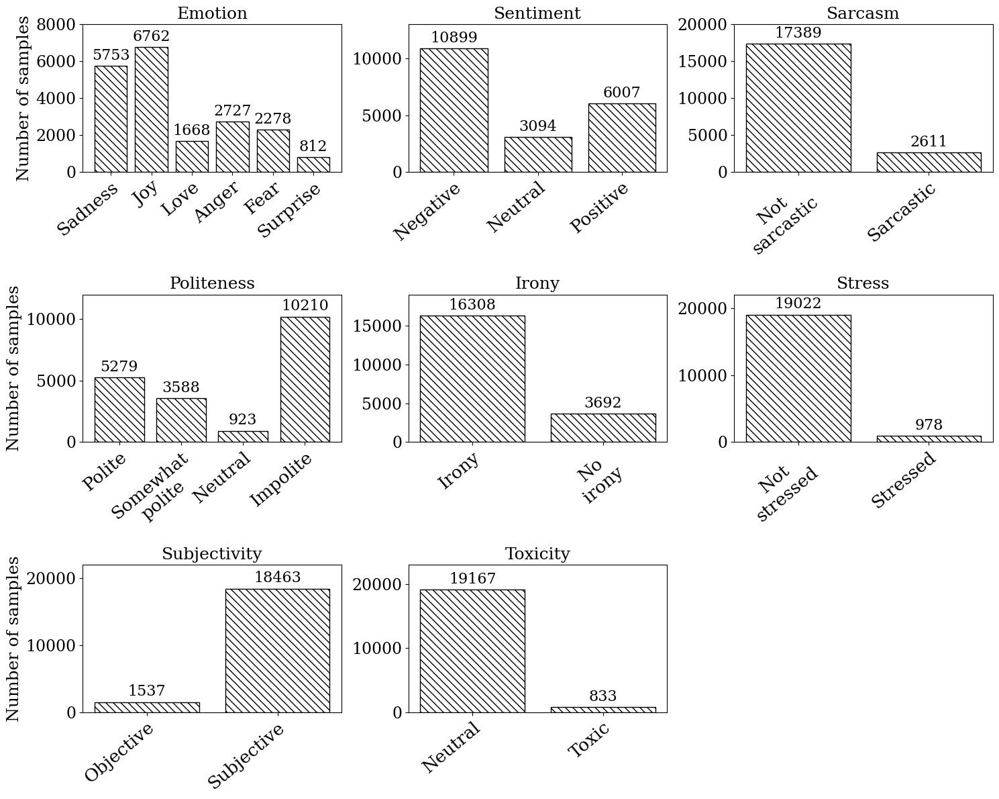

In [ ]:
fig, axes = plt.subplots(3, 3)

fig.set_figwidth(15)
fig.set_figheight(12)

small_fontsize = 18
large_fontsize = 19

task_positions = [
    ["emotion", "sentiment", "sarcasm"],
    ["politeness", "irony", "stress"],
    ["subjectivity", "toxicity"]
]

for row_index in range(len(task_positions[0])):
  for column_index in range(len(task_positions[0])):
    try:
      task_name = task_positions[row_index][column_index]
    except Exception as _:
      print("Skipping and removing empty axis")
      axes[row_index, column_index].remove()
      continue

    bar_container = axes[row_index, column_index].bar(chart_labels[task_name], chart_class_counts[task_name], width=0.8, color="white", edgecolor="black", hatch="\\\\\\")

    axes[row_index, column_index].set(title=task_name.capitalize(), ylim=(0, math.ceil(max(chart_class_counts[task_name] * 1.15) / 1000) * 1000))

    if column_index == 0:
      axes[row_index, column_index].set(ylabel="Number of samples")

    axes[row_index, column_index].bar_label(bar_container, padding=3, fontsize=16)
    xlabels = axes[row_index, column_index].get_xticklabels()
    plt.setp(xlabels, rotation=40, ma="center", ha="right", rotation_mode="anchor", fontsize=large_fontsize)


plt.rc("font", family="serif", serif="DejaVu Serif")
plt.rc('axes', titlesize=large_fontsize)
plt.rc('axes', labelsize=large_fontsize)
plt.rc('xtick', labelsize=large_fontsize)
plt.rc('ytick', labelsize=small_fontsize)

plt.subplots_adjust(hspace=-1.499999)
fig.tight_layout()

plt.savefig("intra_dataset_teacher_prediction_distributions.pdf")

plt.show()

# The multi-task model

The multi-task model in based on the DistilBertForSequenceClassification implementation of the transformers library, which is extended to support multple classification heads.

A module dictionary is used to store the task-specific layers, so that they are correctly registered. Using a regular Python dictionary or a list would not register them fully, possible resulting in unexpected behaviour.

NOTE: The forward method returns a dictionaty which also includes the last hidden states. The returned type likely is not fully compatible with the default trained included with the transformers library.

Customized trainer and training arguments are also defined, extending the implemetations of the transformers library. They are needed for the non-standard hyperparameter and loss functions. The returned value of the loss calculation method is compatible with the tranformers library, as otherwise the non-overridden classes would not work with the customized class.

In [12]:
class MultiTaskDistilBertForSequenceClassification(DistilBertForSequenceClassification):
    def __init__(self, config: PreTrainedConfig, output_dims):
        super().__init__(config)
        self.config = config

        self.distilbert = DistilBertModel(config)

        self.pre_classifiers = nn.ModuleDict()
        self.classifiers = nn.ModuleDict()

        for task in output_dims.keys():
          self.pre_classifiers[task] = nn.Linear(config.dim, config.dim)
          self.classifiers[task] = nn.Linear(config.dim, output_dims[task])

        self.dropout = nn.Dropout(config.seq_classif_dropout)
        self.relu = nn.ReLU()

        # Initialize weights and apply final processing
        self.post_init()

    def forward(
        self,
        input_ids: torch.Tensor | None = None,
        attention_mask: torch.Tensor | None = None,
        inputs_embeds: torch.Tensor | None = None,
        labels: torch.LongTensor | None = None,
        position_ids: torch.Tensor | None = None,
        **kwargs,
    ):
        distilbert_output = self.distilbert(
            input_ids=input_ids,
            attention_mask=attention_mask,
            inputs_embeds=inputs_embeds,
            position_ids=position_ids,
            **kwargs,
        )

        hidden_state = distilbert_output[0]  # (bs, seq_len, dim)
        pooled_output = hidden_state[:, 0]  # (bs, dim)

        output_logits = {}

        for task in self.pre_classifiers.keys():
          task_pooled_output = self.pre_classifiers[task](pooled_output)
          task_pooled_output = self.relu(task_pooled_output)
          task_pooled_output = self.dropout(task_pooled_output)
          output_logits[task] = self.classifiers[task](task_pooled_output)

        return {
            "output_logits": output_logits,
            "last_hidden_state": distilbert_output.last_hidden_state
        }

In [13]:
# Customized Trainer is needed to calculate the distillation losses and weights

@dataclass
class MultiTaskTrainingArguments(TrainingArguments):
  alpha_kldiv: float = field(default=0.5)
  alpha_cosine: float = field(default=0.5)
  T: float = field(default=2.0)
  tasks: list[str] = field(default_factory=lambda: ["emotion"])
  target_task: str = field(default="emotion")

class MultiTaskTrainer(Trainer):
  missing_loss_target_warning = False

  def compute_loss(self, model, inputs, return_outputs=False, num_items_in_batch=None):
    T = self.args.T
    # Weight to lower the impact of relation KD losses
    alpha_kldiv = self.args.alpha_kldiv
    # Weight to lower the impact of feature KD losses
    alpha_cosine = self.args.alpha_cosine

    labels = inputs.pop("labels")
    batch_size = len(labels)

    # Calculate predictions and hidden states
    output = model(**inputs, return_dict=True, output_hidden_states=True)
    output_logits = output["output_logits"]
    last_hidden_state = output["last_hidden_state"]

    # Calculate mean embedings
    input_mask_expanded = inputs["attention_mask"].unsqueeze(-1).expand(last_hidden_state.size()).float()
    mean_embeddings = torch.sum(last_hidden_state * input_mask_expanded, 1) / torch.clamp(input_mask_expanded.sum(1), min=1e-9)

    # Loss fucntions
    ce_loss = nn.CrossEntropyLoss()
    kl_div_loss = nn.KLDivLoss(reduction="batchmean")
    cosine_loss = nn.CosineEmbeddingLoss()

    # Target task ground truth loss
    target_task_hard_loss = ce_loss(output_logits[self.args.target_task], labels)

    # All the distillation losses
    kd_logit_losses = {}
    kd_feature_losses = {}

    for task in self.args.tasks:
      try:
        kl_div_target = inputs.pop(f"teacher_logits_{task}")
        cosine_target = inputs.pop(f"teacher_embeddings_{task}")
      except Exception as e:
        if not self.missing_loss_target_warning:
          print(f"Warning! Missing distillation loss targets for {task}, OK for just emotion detection evaluation NOT OK for training")
          self.missing_loss_target_warning = True
        continue

      kd_logit_losses[task] = kl_div_loss(F.log_softmax(output_logits[task] / T, dim=1), F.softmax(kl_div_target / T, dim=1)) * (T**2) * alpha_kldiv
      kd_feature_losses[task] = cosine_loss(mean_embeddings, cosine_target, torch.ones((batch_size))) * alpha_cosine

    # Sum all the losses to get the overall loss
    overall_loss = target_task_hard_loss + sum(kd_logit_losses.values()) + sum(kd_feature_losses.values())

    if return_outputs:
      return overall_loss, {"outputs": output_logits[self.args.target_task], "loss": overall_loss}
    else:
      return overall_loss


# Tokenization

The dataset is tokenized using the tokenizer of the model the customized multi-task model is derived from.

In [14]:
tokenizer = AutoTokenizer.from_pretrained("distilbert/distilbert-base-uncased")

tokenize = lambda examples: tokenizer(examples["text"], padding="max_length", truncation=True, max_length=256, return_tensors="pt")

# Tokenize the primary dataset
emotion_dataset = emotion_dataset.map(tokenize, batched=True)

# And the larger dataset of unseen samples
emotion_dataset_unseen = emotion_dataset_unseen.map(tokenize, batched=True)

config.json:   0%|          | 0.00/483 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

Map:   0%|          | 0/16000 [00:00<?, ? examples/s]

Map:   0%|          | 0/2000 [00:00<?, ? examples/s]

Map:   0%|          | 0/2000 [00:00<?, ? examples/s]

Map:   0%|          | 0/50000 [00:00<?, ? examples/s]

# Single auxiliary task impact evaluation

In this section a model is trained for each of the auxiliary tasks to produce metrics on their impact with the test set. In general the task definitions dictionary is iterated over (excluding the target task), and a final model is loaded for each task based on the evaluation set macro F1.

JSON is used to store and output the metrics, which enables further automatic processing.

In [ ]:
single_aux_task_evaluation = {}

metric = evaluate.load("f1")

def compute_metrics(eval_pred):
    logits, labels = eval_pred

    predictions = np.argmax(logits, axis=-1)
    return metric.compute(predictions=predictions, references=labels, average="macro")

for task_name, task_details in task_definitions.items():
  if task_name == "emotion":
    continue

  print(f"Evaluation emotion + {task_name}")

  training_args = MultiTaskTrainingArguments(
      output_dir="multitask_classifier",
      remove_unused_columns=False,
      dataloader_pin_memory=False,
      logging_strategy="steps",
      logging_steps=200,
      eval_strategy="steps",
      eval_steps=200,
      save_strategy="steps",
      save_steps=200,
      load_best_model_at_end=True,
      metric_for_best_model="f1",
      per_device_train_batch_size=32,
      per_device_eval_batch_size=32,
      learning_rate=2e-5,
      num_train_epochs=5,
      alpha_kldiv=0.5,
      alpha_cosine=0.5,
      T=2,
      tasks=["emotion", task_name]
  )

  output_dims = {
      "emotion": len(task_definitions["emotion"]["labels"]),
      task_name: len(task_details["labels"])
  }

  model = MultiTaskDistilBertForSequenceClassification.from_pretrained("distilbert/distilbert-base-uncased", output_dims=output_dims)

  trainer = MultiTaskTrainer(
      model=model,
      args=training_args,
      train_dataset=emotion_dataset["train"],
      eval_dataset=emotion_dataset["validate"],
      compute_metrics=compute_metrics,
  )

  trainer.train()

  # Save predictions for the test set
  test_set_predictions = trainer.predict(emotion_dataset["test"])[0]

  report = classification_report(emotion_dataset["test"].with_format("numpy")["label"], np.argmax(test_set_predictions, axis=1), digits=4, output_dict=True, target_names=dict([(value, key) for key, value in task_definitions["emotion"]["labels"].items()]))

  print(f"Macro F1 for {task_name}: {report["macro avg"]["f1-score"]}")

  single_aux_task_evaluation[task_name] = report

Evaluation emotion + sentiment


Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

MultiTaskDistilBertForSequenceClassification LOAD REPORT from: distilbert/distilbert-base-uncased
Key                              | Status     | 
---------------------------------+------------+-
vocab_projector.bias             | UNEXPECTED | 
vocab_layer_norm.weight          | UNEXPECTED | 
vocab_transform.weight           | UNEXPECTED | 
vocab_layer_norm.bias            | UNEXPECTED | 
vocab_transform.bias             | UNEXPECTED | 
pre_classifiers.emotion.weight   | MISSING    | 
pre_classifiers.sentiment.bias   | MISSING    | 
pre_classifier.weight            | MISSING    | 
classifiers.emotion.bias         | MISSING    | 
classifiers.sentiment.bias       | MISSING    | 
pre_classifiers.sentiment.weight | MISSING    | 
pre_classifier.bias              | MISSING    | 
classifiers.sentiment.weight     | MISSING    | 
classifier.weight                | MISSING    | 
classifier.bias                  | MISSING    | 
pre_classifiers.emotion.bias     | MISSING    | 
classifiers.emotion.

Step,Training Loss,Validation Loss,F1
200,3.428695,1.976890,0.624349
400,1.571843,1.082721,0.882681
600,1.032607,0.890603,0.894444
800,0.858216,0.845285,0.893101
1000,0.806885,0.784719,0.889464
1200,0.692573,0.783360,0.891096
1400,0.668400,0.722001,0.892044
1600,0.624112,0.711039,0.896351
1800,0.597861,0.705996,0.895425
2000,0.592125,0.697267,0.890152


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.weight', 'distilbert.embeddings.LayerNorm.bias'].
There were unexpected keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.beta', 'distilbert.embeddings.LayerNorm.gamma'].


Macro F1 for sentiment: 0.9073958147862814
Evaluation emotion + sarcasm


Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

MultiTaskDistilBertForSequenceClassification LOAD REPORT from: distilbert/distilbert-base-uncased
Key                            | Status     | 
-------------------------------+------------+-
vocab_projector.bias           | UNEXPECTED | 
vocab_layer_norm.weight        | UNEXPECTED | 
vocab_transform.weight         | UNEXPECTED | 
vocab_layer_norm.bias          | UNEXPECTED | 
vocab_transform.bias           | UNEXPECTED | 
pre_classifiers.emotion.weight | MISSING    | 
classifiers.sarcasm.weight     | MISSING    | 
pre_classifier.weight          | MISSING    | 
classifiers.emotion.bias       | MISSING    | 
pre_classifier.bias            | MISSING    | 
pre_classifiers.sarcasm.weight | MISSING    | 
classifier.weight              | MISSING    | 
classifier.bias                | MISSING    | 
classifiers.sarcasm.bias       | MISSING    | 
pre_classifiers.emotion.bias   | MISSING    | 
classifiers.emotion.weight     | MISSING    | 
pre_classifiers.sarcasm.bias   | MISSING    | 

Notes:
-

Step,Training Loss,Validation Loss,F1
200,3.036220,1.672289,0.658882
400,1.360760,0.949052,0.895202
600,0.927963,0.802955,0.895754
800,0.745776,0.713438,0.903378
1000,0.703945,0.685407,0.895132
1200,0.591746,0.684672,0.909602
1400,0.569135,0.643074,0.893548
1600,0.531887,0.625870,0.897326
1800,0.514081,0.606877,0.900761
2000,0.506775,0.602514,0.899881


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.weight', 'distilbert.embeddings.LayerNorm.bias'].
There were unexpected keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.beta', 'distilbert.embeddings.LayerNorm.gamma'].


Macro F1 for sarcasm: 0.9009841776034753
Evaluation emotion + politeness


Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

MultiTaskDistilBertForSequenceClassification LOAD REPORT from: distilbert/distilbert-base-uncased
Key                               | Status     | 
----------------------------------+------------+-
vocab_projector.bias              | UNEXPECTED | 
vocab_layer_norm.weight           | UNEXPECTED | 
vocab_transform.weight            | UNEXPECTED | 
vocab_layer_norm.bias             | UNEXPECTED | 
vocab_transform.bias              | UNEXPECTED | 
pre_classifiers.emotion.weight    | MISSING    | 
pre_classifiers.politeness.bias   | MISSING    | 
pre_classifier.weight             | MISSING    | 
pre_classifiers.politeness.weight | MISSING    | 
classifiers.emotion.bias          | MISSING    | 
pre_classifier.bias               | MISSING    | 
classifier.weight                 | MISSING    | 
classifiers.politeness.weight     | MISSING    | 
classifiers.politeness.bias       | MISSING    | 
classifier.bias                   | MISSING    | 
pre_classifiers.emotion.bias      | MISSING    | 
cl

Step,Training Loss,Validation Loss,F1
200,3.782646,2.275968,0.645120
400,1.901962,1.324531,0.883032
600,1.245901,1.037847,0.888102
800,1.010903,0.938861,0.900267
1000,0.917852,0.866881,0.883040
1200,0.772721,0.847213,0.903755
1400,0.727338,0.804982,0.894419
1600,0.676343,0.778043,0.887169
1800,0.645936,0.754120,0.887466
2000,0.637962,0.732928,0.890460


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.weight', 'distilbert.embeddings.LayerNorm.bias'].
There were unexpected keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.beta', 'distilbert.embeddings.LayerNorm.gamma'].


Macro F1 for politeness: 0.9032688258383753
Evaluation emotion + irony


Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

MultiTaskDistilBertForSequenceClassification LOAD REPORT from: distilbert/distilbert-base-uncased
Key                            | Status     | 
-------------------------------+------------+-
vocab_projector.bias           | UNEXPECTED | 
vocab_layer_norm.weight        | UNEXPECTED | 
vocab_transform.weight         | UNEXPECTED | 
vocab_layer_norm.bias          | UNEXPECTED | 
vocab_transform.bias           | UNEXPECTED | 
pre_classifiers.emotion.weight | MISSING    | 
pre_classifier.weight          | MISSING    | 
classifiers.emotion.bias       | MISSING    | 
classifiers.irony.weight       | MISSING    | 
pre_classifier.bias            | MISSING    | 
classifier.weight              | MISSING    | 
classifiers.irony.bias         | MISSING    | 
classifier.bias                | MISSING    | 
pre_classifiers.emotion.bias   | MISSING    | 
pre_classifiers.irony.weight   | MISSING    | 
classifiers.emotion.weight     | MISSING    | 
pre_classifiers.irony.bias     | MISSING    | 

Notes:
-

Step,Training Loss,Validation Loss,F1
200,3.140223,1.715748,0.687448
400,1.368992,0.915657,0.890675
600,0.892437,0.781352,0.896400
800,0.747245,0.747198,0.884934
1000,0.714447,0.718166,0.876677
1200,0.616035,0.729539,0.903892
1400,0.602350,0.691644,0.893706
1600,0.577205,0.664575,0.892802
1800,0.561021,0.652084,0.896582
2000,0.548025,0.642601,0.892945


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.weight', 'distilbert.embeddings.LayerNorm.bias'].
There were unexpected keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.beta', 'distilbert.embeddings.LayerNorm.gamma'].


Macro F1 for irony: 0.9062942549645142
Evaluation emotion + stress


Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

MultiTaskDistilBertForSequenceClassification LOAD REPORT from: distilbert/distilbert-base-uncased
Key                            | Status     | 
-------------------------------+------------+-
vocab_projector.bias           | UNEXPECTED | 
vocab_layer_norm.weight        | UNEXPECTED | 
vocab_transform.weight         | UNEXPECTED | 
vocab_layer_norm.bias          | UNEXPECTED | 
vocab_transform.bias           | UNEXPECTED | 
pre_classifiers.emotion.weight | MISSING    | 
classifiers.stress.weight      | MISSING    | 
pre_classifier.weight          | MISSING    | 
classifiers.emotion.bias       | MISSING    | 
pre_classifier.bias            | MISSING    | 
classifier.weight              | MISSING    | 
classifiers.stress.bias        | MISSING    | 
pre_classifiers.stress.weight  | MISSING    | 
classifier.bias                | MISSING    | 
pre_classifiers.stress.bias    | MISSING    | 
pre_classifiers.emotion.bias   | MISSING    | 
classifiers.emotion.weight     | MISSING    | 

Notes:
-

Step,Training Loss,Validation Loss,F1
200,3.425235,1.846951,0.616438
400,1.436018,0.926278,0.894796
600,0.927818,0.787512,0.899830
800,0.762989,0.744255,0.900556
1000,0.741045,0.695106,0.885079
1200,0.612949,0.684194,0.900153
1400,0.592918,0.640393,0.893872
1600,0.538693,0.640734,0.888852
1800,0.530271,0.622362,0.896289
2000,0.524788,0.608760,0.895167


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.weight', 'distilbert.embeddings.LayerNorm.bias'].
There were unexpected keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.beta', 'distilbert.embeddings.LayerNorm.gamma'].


Macro F1 for stress: 0.9131663944334623
Evaluation emotion + subjectivity


Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

MultiTaskDistilBertForSequenceClassification LOAD REPORT from: distilbert/distilbert-base-uncased
Key                                 | Status     | 
------------------------------------+------------+-
vocab_projector.bias                | UNEXPECTED | 
vocab_layer_norm.weight             | UNEXPECTED | 
vocab_transform.weight              | UNEXPECTED | 
vocab_layer_norm.bias               | UNEXPECTED | 
vocab_transform.bias                | UNEXPECTED | 
pre_classifiers.emotion.weight      | MISSING    | 
pre_classifier.weight               | MISSING    | 
classifiers.subjectivity.weight     | MISSING    | 
classifiers.emotion.bias            | MISSING    | 
pre_classifier.bias                 | MISSING    | 
classifier.weight                   | MISSING    | 
pre_classifiers.subjectivity.bias   | MISSING    | 
classifier.bias                     | MISSING    | 
pre_classifiers.emotion.bias        | MISSING    | 
classifiers.emotion.weight          | MISSING    | 
classifiers.subjec

Step,Training Loss,Validation Loss,F1
200,3.021528,1.525072,0.690972
400,1.193556,0.776587,0.890636
600,0.771472,0.670927,0.889780
800,0.640169,0.617799,0.898087
1000,0.616479,0.604183,0.890346
1200,0.524114,0.640199,0.902783
1400,0.522507,0.581443,0.892341
1600,0.486857,0.572471,0.890955
1800,0.477559,0.568591,0.892946
2000,0.470467,0.556871,0.896499


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Step,Training Loss,Validation Loss,F1
200,3.021528,1.525072,0.690972
400,1.193556,0.776587,0.890636
600,0.771472,0.670927,0.889780
800,0.640169,0.617799,0.898087
1000,0.616479,0.604183,0.890346
1200,0.524114,0.640199,0.902783
1400,0.522507,0.581443,0.892341
1600,0.486857,0.572471,0.890955
1800,0.477559,0.568591,0.892946
2000,0.470467,0.556871,0.896499


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.weight', 'distilbert.embeddings.LayerNorm.bias'].
There were unexpected keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.beta', 'distilbert.embeddings.LayerNorm.gamma'].


Macro F1 for subjectivity: 0.902779191500549
Evaluation emotion + toxicity


Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

MultiTaskDistilBertForSequenceClassification LOAD REPORT from: distilbert/distilbert-base-uncased
Key                             | Status     | 
--------------------------------+------------+-
vocab_projector.bias            | UNEXPECTED | 
vocab_layer_norm.weight         | UNEXPECTED | 
vocab_transform.weight          | UNEXPECTED | 
vocab_layer_norm.bias           | UNEXPECTED | 
vocab_transform.bias            | UNEXPECTED | 
pre_classifiers.emotion.weight  | MISSING    | 
classifiers.toxicity.bias       | MISSING    | 
pre_classifier.weight           | MISSING    | 
pre_classifiers.toxicity.bias   | MISSING    | 
classifiers.emotion.bias        | MISSING    | 
pre_classifiers.toxicity.weight | MISSING    | 
pre_classifier.bias             | MISSING    | 
classifier.weight               | MISSING    | 
classifiers.toxicity.weight     | MISSING    | 
classifier.bias                 | MISSING    | 
pre_classifiers.emotion.bias    | MISSING    | 
classifiers.emotion.weight      | MISS

Step,Training Loss,Validation Loss,F1
200,3.416826,1.853057,0.627006
400,1.467182,0.974056,0.892833
600,0.931814,0.769484,0.891254
800,0.760318,0.737542,0.893071
1000,0.723256,0.708629,0.889517
1200,0.603465,0.693565,0.905611
1400,0.592336,0.654436,0.892745
1600,0.553570,0.659246,0.893168
1800,0.538179,0.627531,0.891628
2000,0.530217,0.617844,0.892562


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.weight', 'distilbert.embeddings.LayerNorm.bias'].
There were unexpected keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.beta', 'distilbert.embeddings.LayerNorm.gamma'].


Macro F1 for toxicity: 0.909148333932023


In [ ]:
for task in single_aux_task_evaluation.keys():
  print(f"task {task} macro F1: {single_aux_task_evaluation[task]["macro avg"]["f1-score"]}")

task sentiment macro F1: 0.9073958147862814
task sarcasm macro F1: 0.9009841776034753
task politeness macro F1: 0.9032688258383753
task irony macro F1: 0.9062942549645142
task stress macro F1: 0.9131663944334623
task subjectivity macro F1: 0.902779191500549
task toxicity macro F1: 0.909148333932023


In [ ]:
# Print in a human and machine readable format
print(json.dumps(single_aux_task_evaluation, sort_keys=True, indent=4))

{
    "irony": {
        "accuracy": 0.932,
        "anger": {
            "f1-score": 0.9360146252285192,
            "precision": 0.924187725631769,
            "recall": 0.9481481481481482,
            "support": 270.0
        },
        "fear": {
            "f1-score": 0.8957345971563981,
            "precision": 0.9219512195121952,
            "recall": 0.8709677419354839,
            "support": 217.0
        },
        "joy": {
            "f1-score": 0.9428347689898199,
            "precision": 0.9885057471264368,
            "recall": 0.9011976047904192,
            "support": 668.0
        },
        "love": {
            "f1-score": 0.8699551569506726,
            "precision": 0.7791164658634538,
            "recall": 0.9847715736040609,
            "support": 197.0
        },
        "macro avg": {
            "f1-score": 0.9062942549645142,
            "precision": 0.8858685800155489,
            "recall": 0.9369716392897237,
            "support": 2000.0
        },
      

# Impact of all auxiliary tasks

To see how the model would react when trained jointly with all of the auxiliary tasks, a model is also fine-tuned. This option was not selected as the final model.

In [ ]:
metric = evaluate.load("f1")

def compute_metrics(eval_pred):
    logits, labels = eval_pred

    predictions = np.argmax(logits, axis=-1)
    return metric.compute(predictions=predictions, references=labels, average="macro")

training_args = MultiTaskTrainingArguments(
    output_dir="multitask_classifier",
    remove_unused_columns=False,
    dataloader_pin_memory=False,
    logging_strategy="steps",
    logging_steps=200,
    eval_strategy="steps",
    eval_steps=200,
    save_strategy="steps",
    save_steps=200,
    load_best_model_at_end=True,
    metric_for_best_model="f1",
    per_device_train_batch_size=32,
    per_device_eval_batch_size=32,
    learning_rate=2e-5,
    num_train_epochs=5,
    alpha_kldiv=0.5,
    alpha_cosine=0.5,
    T=2,
    tasks=list(task_definition.keys())
)

output_dims = {task_name: len(task_definition["labels"]) for task_name, task_definition in task_definitions.items()}

model = MultiTaskDistilBertForSequenceClassification.from_pretrained("distilbert/distilbert-base-uncased", output_dims=output_dims)

trainer = MultiTaskTrainer(
    model=model,
    args=training_args,
    train_dataset=emotion_dataset["train"],
    eval_dataset=emotion_dataset["validate"],
    compute_metrics=compute_metrics,
    # callbacks=[EarlyStoppingCallback(early_stopping_patience=5)],
)

trainer.train()

Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

MultiTaskDistilBertForSequenceClassification LOAD REPORT from: distilbert/distilbert-base-uncased
Key                                 | Status     | 
------------------------------------+------------+-
vocab_projector.bias                | UNEXPECTED | 
vocab_layer_norm.weight             | UNEXPECTED | 
vocab_transform.bias                | UNEXPECTED | 
vocab_layer_norm.bias               | UNEXPECTED | 
vocab_transform.weight              | UNEXPECTED | 
classifier.weight                   | MISSING    | 
pre_classifiers.subjectivity.bias   | MISSING    | 
pre_classifier.weight               | MISSING    | 
pre_classifiers.politeness.weight   | MISSING    | 
pre_classifiers.subjectivity.weight | MISSING    | 
pre_classifiers.stress.weight       | MISSING    | 
classifiers.irony.bias              | MISSING    | 
pre_classifiers.sentiment.bias      | MISSING    | 
classifiers.toxicity.weight         | MISSING    | 
classifiers.politeness.weight       | MISSING    | 
classifiers.polite

Step,Training Loss,Validation Loss,F1
200,2.650108,1.281060,0.692194
400,0.972876,0.556713,0.890042
600,0.504112,0.416388,0.892859
800,0.347126,0.310682,0.903012
1000,0.303925,0.291018,0.901137
1200,0.216291,0.323135,0.906103
1400,0.196551,0.269520,0.885438
1600,0.174196,0.251989,0.900566
1800,0.165458,0.262663,0.896668
2000,0.159853,0.242816,0.892355


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.weight', 'distilbert.embeddings.LayerNorm.bias'].
There were unexpected keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.beta', 'distilbert.embeddings.LayerNorm.gamma'].


TrainOutput(global_step=2500, training_loss=0.4828259716033936, metrics={'train_runtime': 829.7636, 'train_samples_per_second': 96.413, 'train_steps_per_second': 3.013, 'total_flos': 5881444884480000.0, 'train_loss': 0.4828259716033936, 'epoch': 5.0})

In [ ]:
# Save predictions for the test set
test_set_predictions = trainer.predict(emotion_dataset["test"])[0]

print(classification_report(emotion_dataset["test"].with_format("numpy")["label"], np.argmax(test_set_predictions, axis=1), digits=4, target_names=dict([(value, key) for key, value in task_definitions["emotion"]["labels"].items()])))

              precision    recall  f1-score   support

     sadness     0.9807    0.9622    0.9714       582
         joy     0.9901    0.9027    0.9444       668
        love     0.7942    0.9797    0.8773       197
       anger     0.9309    0.9481    0.9394       270
        fear     0.9028    0.8986    0.9007       217
    surprise     0.7093    0.9242    0.8026        66

    accuracy                         0.9340      2000
   macro avg     0.8847    0.9359    0.9060      2000
weighted avg     0.9414    0.9340    0.9356      2000



# Hyperparameter optimization with the best performing tasks

Based on the single task impact evaluation, stress and toxicity were selected as the best performing tasks, so the distillation related hyperparameters are optimized for the final model using optuna. 50 trials was selected as a compromise between results and computation time, since the default sampler uses random sampling for the first 10 trials.

Optuna's internal hyperparameter importance and relationship plots are used to produce plots, which are customized to be consistent with the rest of the thesis.

In [ ]:
metric = evaluate.load("f1")

def compute_metrics(eval_pred):
    logits, labels = eval_pred

    predictions = np.argmax(logits, axis=-1)
    return metric.compute(predictions=predictions, references=labels, average="macro")

def objective(trial):
  alpha_kldiv = trial.suggest_float("alpha_kldiv", 0.0, 1.0)
  alpha_cosine = trial.suggest_float("alpha_cosine", 0.0, 1.0)
  T = trial.suggest_int("T", 1, 10)

  training_args = MultiTaskTrainingArguments(
      output_dir="multitask_classifier",
      remove_unused_columns=False,
      dataloader_pin_memory=False,
      logging_strategy="steps",
      logging_steps=200,
      eval_strategy="steps",
      eval_steps=200,
      save_strategy="steps",
      save_steps=200,
      load_best_model_at_end=True,
      metric_for_best_model="f1",
      per_device_train_batch_size=32,
      per_device_eval_batch_size=32,
      learning_rate=2e-5,
      num_train_epochs=5,
      alpha_kldiv=alpha_kldiv,
      alpha_cosine=alpha_cosine,
      T=T,
      tasks=["emotion", "stress", "toxicity"]
  )

  output_dims = {
      "emotion": len(task_definitions["emotion"]["labels"]),
      "stress": len(task_definitions["stress"]["labels"]),
      "toxicity": len(task_definitions["toxicity"]["labels"])
  }

  model = MultiTaskDistilBertForSequenceClassification.from_pretrained("distilbert/distilbert-base-uncased", output_dims=output_dims)

  trainer = MultiTaskTrainer(
      model=model,
      args=training_args,
      train_dataset=emotion_dataset["train"],
      eval_dataset=emotion_dataset["validate"],
      compute_metrics=compute_metrics,
  )

  trainer.train()

  eval_results = trainer.evaluate(eval_dataset=emotion_dataset["validate"])

  return eval_results["eval_f1"]

In [ ]:
study = optuna.create_study(direction="maximize")

study.optimize(objective, n_trials=50, n_jobs=1)

print(f"Best params are {study.best_params} with value {study.best_value}")



[I 2026-04-03 17:58:39,611] A new study created in memory with name: no-name-b3f98be3-851b-4121-a929-571d6840cab8


Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

MultiTaskDistilBertForSequenceClassification LOAD REPORT from: distilbert/distilbert-base-uncased
Key                             | Status     | 
--------------------------------+------------+-
vocab_transform.weight          | UNEXPECTED | 
vocab_layer_norm.weight         | UNEXPECTED | 
vocab_projector.bias            | UNEXPECTED | 
vocab_layer_norm.bias           | UNEXPECTED | 
vocab_transform.bias            | UNEXPECTED | 
classifiers.emotion.weight      | MISSING    | 
pre_classifiers.stress.bias     | MISSING    | 
classifiers.toxicity.bias       | MISSING    | 
pre_classifiers.emotion.bias    | MISSING    | 
classifiers.emotion.bias        | MISSING    | 
classifier.bias                 | MISSING    | 
classifiers.toxicity.weight     | MISSING    | 
pre_classifiers.emotion.weight  | MISSING    | 
pre_classifiers.toxicity.bias   | MISSING    | 
pre_classifiers.stress.weight   | MISSING    | 
classifiers.stress.bias         | MISSING    | 
pre_classifier.weight           | MISS

Step,Training Loss,Validation Loss,F1
200,6.678593,4.107062,0.548669
400,3.359214,2.466810,0.855722
600,2.368813,2.084567,0.871048
800,2.026517,1.897066,0.894364
1000,1.897884,1.816598,0.872842
1200,1.709103,1.766473,0.894649
1400,1.676849,1.716988,0.894992
1600,1.608964,1.688997,0.891588
1800,1.569659,1.687309,0.896404
2000,1.569062,1.655996,0.889901


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.weight', 'distilbert.embeddings.LayerNorm.bias'].
There were unexpected keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.beta', 'distilbert.embeddings.LayerNorm.gamma'].


[I 2026-04-03 18:12:39,660] Trial 0 finished with value: 0.8993296716215959 and parameters: {'alpha_kldiv': 0.5526774991932567, 'alpha_cosine': 0.914972211035445, 'T': 4}. Best is trial 0 with value: 0.8993296716215959.


Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

MultiTaskDistilBertForSequenceClassification LOAD REPORT from: distilbert/distilbert-base-uncased
Key                             | Status     | 
--------------------------------+------------+-
vocab_transform.weight          | UNEXPECTED | 
vocab_layer_norm.weight         | UNEXPECTED | 
vocab_projector.bias            | UNEXPECTED | 
vocab_layer_norm.bias           | UNEXPECTED | 
vocab_transform.bias            | UNEXPECTED | 
classifiers.emotion.weight      | MISSING    | 
pre_classifiers.stress.bias     | MISSING    | 
classifiers.toxicity.bias       | MISSING    | 
pre_classifiers.emotion.bias    | MISSING    | 
classifiers.emotion.bias        | MISSING    | 
classifier.bias                 | MISSING    | 
classifiers.toxicity.weight     | MISSING    | 
pre_classifiers.emotion.weight  | MISSING    | 
pre_classifiers.toxicity.bias   | MISSING    | 
pre_classifiers.stress.weight   | MISSING    | 
classifiers.stress.bias         | MISSING    | 
pre_classifier.weight           | MISS

Step,Training Loss,Validation Loss,F1
200,9.134375,5.084281,0.503951
400,4.026140,2.607065,0.746423
600,2.313779,1.810754,0.879867
800,1.788258,1.659382,0.897583
1000,1.606047,1.513941,0.880731
1200,1.342713,1.406510,0.899602
1400,1.301040,1.391750,0.898407
1600,1.232174,1.344907,0.899583
1800,1.165556,1.325860,0.896990
2000,1.167113,1.317145,0.887170


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.weight', 'distilbert.embeddings.LayerNorm.bias'].
There were unexpected keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.beta', 'distilbert.embeddings.LayerNorm.gamma'].


[I 2026-04-03 18:26:45,495] Trial 1 finished with value: 0.8996023951959105 and parameters: {'alpha_kldiv': 0.9075253235087184, 'alpha_cosine': 0.46748687963023017, 'T': 6}. Best is trial 1 with value: 0.8996023951959105.


Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

MultiTaskDistilBertForSequenceClassification LOAD REPORT from: distilbert/distilbert-base-uncased
Key                             | Status     | 
--------------------------------+------------+-
vocab_transform.weight          | UNEXPECTED | 
vocab_layer_norm.weight         | UNEXPECTED | 
vocab_projector.bias            | UNEXPECTED | 
vocab_layer_norm.bias           | UNEXPECTED | 
vocab_transform.bias            | UNEXPECTED | 
classifiers.emotion.weight      | MISSING    | 
pre_classifiers.stress.bias     | MISSING    | 
classifiers.toxicity.bias       | MISSING    | 
pre_classifiers.emotion.bias    | MISSING    | 
classifiers.emotion.bias        | MISSING    | 
classifier.bias                 | MISSING    | 
classifiers.toxicity.weight     | MISSING    | 
pre_classifiers.emotion.weight  | MISSING    | 
pre_classifiers.toxicity.bias   | MISSING    | 
pre_classifiers.stress.weight   | MISSING    | 
classifiers.stress.bias         | MISSING    | 
pre_classifier.weight           | MISS

Step,Training Loss,Validation Loss,F1
200,6.257830,3.537353,0.514891
400,2.876933,1.997241,0.790789
600,1.789326,1.463487,0.883577
800,1.437708,1.339048,0.898851
1000,1.312647,1.248919,0.880495
1200,1.127171,1.187308,0.899338
1400,1.096940,1.169071,0.896013
1600,1.049405,1.128460,0.894325
1800,0.999823,1.115263,0.890468
2000,1.005433,1.102924,0.886296


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.weight', 'distilbert.embeddings.LayerNorm.bias'].
There were unexpected keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.beta', 'distilbert.embeddings.LayerNorm.gamma'].


[I 2026-04-03 18:40:47,766] Trial 2 finished with value: 0.8993377540870888 and parameters: {'alpha_kldiv': 0.5371674917247881, 'alpha_cosine': 0.45730057431554283, 'T': 10}. Best is trial 1 with value: 0.8996023951959105.


Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

MultiTaskDistilBertForSequenceClassification LOAD REPORT from: distilbert/distilbert-base-uncased
Key                             | Status     | 
--------------------------------+------------+-
vocab_transform.weight          | UNEXPECTED | 
vocab_layer_norm.weight         | UNEXPECTED | 
vocab_projector.bias            | UNEXPECTED | 
vocab_layer_norm.bias           | UNEXPECTED | 
vocab_transform.bias            | UNEXPECTED | 
classifiers.emotion.weight      | MISSING    | 
pre_classifiers.stress.bias     | MISSING    | 
classifiers.toxicity.bias       | MISSING    | 
pre_classifiers.emotion.bias    | MISSING    | 
classifiers.emotion.bias        | MISSING    | 
classifier.bias                 | MISSING    | 
classifiers.toxicity.weight     | MISSING    | 
pre_classifiers.emotion.weight  | MISSING    | 
pre_classifiers.toxicity.bias   | MISSING    | 
pre_classifiers.stress.weight   | MISSING    | 
classifiers.stress.bias         | MISSING    | 
pre_classifier.weight           | MISS

Step,Training Loss,Validation Loss,F1
200,3.178651,2.150981,0.598443
400,1.900661,1.587887,0.892304
600,1.547165,1.465557,0.890715
800,1.431036,1.426763,0.889910
1000,1.396692,1.402991,0.884638
1200,1.311201,1.364115,0.901415
1400,1.293601,1.340409,0.890275
1600,1.260515,1.331349,0.892800
1800,1.240009,1.339786,0.886536
2000,1.240712,1.308880,0.884151


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.weight', 'distilbert.embeddings.LayerNorm.bias'].
There were unexpected keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.beta', 'distilbert.embeddings.LayerNorm.gamma'].


[I 2026-04-03 18:54:50,505] Trial 3 finished with value: 0.9014152762218894 and parameters: {'alpha_kldiv': 0.15175944859106305, 'alpha_cosine': 0.7947722009980186, 'T': 2}. Best is trial 3 with value: 0.9014152762218894.


Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

MultiTaskDistilBertForSequenceClassification LOAD REPORT from: distilbert/distilbert-base-uncased
Key                             | Status     | 
--------------------------------+------------+-
vocab_transform.weight          | UNEXPECTED | 
vocab_layer_norm.weight         | UNEXPECTED | 
vocab_projector.bias            | UNEXPECTED | 
vocab_layer_norm.bias           | UNEXPECTED | 
vocab_transform.bias            | UNEXPECTED | 
classifiers.emotion.weight      | MISSING    | 
pre_classifiers.stress.bias     | MISSING    | 
classifiers.toxicity.bias       | MISSING    | 
pre_classifiers.emotion.bias    | MISSING    | 
classifiers.emotion.bias        | MISSING    | 
classifier.bias                 | MISSING    | 
classifiers.toxicity.weight     | MISSING    | 
pre_classifiers.emotion.weight  | MISSING    | 
pre_classifiers.toxicity.bias   | MISSING    | 
pre_classifiers.stress.weight   | MISSING    | 
classifiers.stress.bias         | MISSING    | 
pre_classifier.weight           | MISS

Step,Training Loss,Validation Loss,F1
200,3.307411,2.216130,0.648934
400,1.993451,1.692806,0.894271
600,1.652730,1.569065,0.895770
800,1.538894,1.515126,0.900609
1000,1.493945,1.498042,0.881554
1200,1.400207,1.462166,0.902517
1400,1.382590,1.445111,0.893544
1600,1.347093,1.426437,0.897090
1800,1.327645,1.432604,0.888350
2000,1.328311,1.404519,0.886838


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.weight', 'distilbert.embeddings.LayerNorm.bias'].
There were unexpected keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.beta', 'distilbert.embeddings.LayerNorm.gamma'].


[I 2026-04-03 19:08:53,045] Trial 4 finished with value: 0.9025165152016058 and parameters: {'alpha_kldiv': 0.5321386479710355, 'alpha_cosine': 0.8539099051448032, 'T': 1}. Best is trial 4 with value: 0.9025165152016058.


Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

MultiTaskDistilBertForSequenceClassification LOAD REPORT from: distilbert/distilbert-base-uncased
Key                             | Status     | 
--------------------------------+------------+-
vocab_transform.weight          | UNEXPECTED | 
vocab_layer_norm.weight         | UNEXPECTED | 
vocab_projector.bias            | UNEXPECTED | 
vocab_layer_norm.bias           | UNEXPECTED | 
vocab_transform.bias            | UNEXPECTED | 
classifiers.emotion.weight      | MISSING    | 
pre_classifiers.stress.bias     | MISSING    | 
classifiers.toxicity.bias       | MISSING    | 
pre_classifiers.emotion.bias    | MISSING    | 
classifiers.emotion.bias        | MISSING    | 
classifier.bias                 | MISSING    | 
classifiers.toxicity.weight     | MISSING    | 
pre_classifiers.emotion.weight  | MISSING    | 
pre_classifiers.toxicity.bias   | MISSING    | 
pre_classifiers.stress.weight   | MISSING    | 
classifiers.stress.bias         | MISSING    | 
pre_classifier.weight           | MISS

Step,Training Loss,Validation Loss,F1
200,2.565411,1.408859,0.647547
400,1.123744,0.749094,0.891013
600,0.731029,0.651535,0.883071
800,0.603125,0.586693,0.896519
1000,0.562381,0.566239,0.881013
1200,0.452820,0.553958,0.903053
1400,0.442108,0.514612,0.888325
1600,0.399941,0.513491,0.893370
1800,0.387113,0.510982,0.885018
2000,0.384730,0.493930,0.888041


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.weight', 'distilbert.embeddings.LayerNorm.bias'].
There were unexpected keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.beta', 'distilbert.embeddings.LayerNorm.gamma'].


[I 2026-04-03 19:22:55,994] Trial 5 finished with value: 0.9030532782708317 and parameters: {'alpha_kldiv': 0.8675254558797575, 'alpha_cosine': 0.13328710662493026, 'T': 1}. Best is trial 5 with value: 0.9030532782708317.


Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

MultiTaskDistilBertForSequenceClassification LOAD REPORT from: distilbert/distilbert-base-uncased
Key                             | Status     | 
--------------------------------+------------+-
vocab_transform.weight          | UNEXPECTED | 
vocab_layer_norm.weight         | UNEXPECTED | 
vocab_projector.bias            | UNEXPECTED | 
vocab_layer_norm.bias           | UNEXPECTED | 
vocab_transform.bias            | UNEXPECTED | 
classifiers.emotion.weight      | MISSING    | 
pre_classifiers.stress.bias     | MISSING    | 
classifiers.toxicity.bias       | MISSING    | 
pre_classifiers.emotion.bias    | MISSING    | 
classifiers.emotion.bias        | MISSING    | 
classifier.bias                 | MISSING    | 
classifiers.toxicity.weight     | MISSING    | 
pre_classifiers.emotion.weight  | MISSING    | 
pre_classifiers.toxicity.bias   | MISSING    | 
pre_classifiers.stress.weight   | MISSING    | 
classifiers.stress.bias         | MISSING    | 
pre_classifier.weight           | MISS

Step,Training Loss,Validation Loss,F1
200,8.613895,4.933912,0.536844
400,3.910553,2.601328,0.855523
600,2.435245,2.050190,0.883496
800,2.004169,1.892612,0.898813
1000,1.813820,1.740691,0.881097
1200,1.549393,1.662064,0.902596
1400,1.508512,1.601804,0.893973
1600,1.438455,1.575092,0.896900
1800,1.384645,1.551939,0.895534
2000,1.384408,1.527775,0.893630


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.weight', 'distilbert.embeddings.LayerNorm.bias'].
There were unexpected keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.beta', 'distilbert.embeddings.LayerNorm.gamma'].


[I 2026-04-03 19:36:59,623] Trial 6 finished with value: 0.9025958850205305 and parameters: {'alpha_kldiv': 0.9703370766481371, 'alpha_cosine': 0.6881780228596338, 'T': 3}. Best is trial 5 with value: 0.9030532782708317.


Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

MultiTaskDistilBertForSequenceClassification LOAD REPORT from: distilbert/distilbert-base-uncased
Key                             | Status     | 
--------------------------------+------------+-
vocab_transform.weight          | UNEXPECTED | 
vocab_layer_norm.weight         | UNEXPECTED | 
vocab_projector.bias            | UNEXPECTED | 
vocab_layer_norm.bias           | UNEXPECTED | 
vocab_transform.bias            | UNEXPECTED | 
classifiers.emotion.weight      | MISSING    | 
pre_classifiers.stress.bias     | MISSING    | 
classifiers.toxicity.bias       | MISSING    | 
pre_classifiers.emotion.bias    | MISSING    | 
classifiers.emotion.bias        | MISSING    | 
classifier.bias                 | MISSING    | 
classifiers.toxicity.weight     | MISSING    | 
pre_classifiers.emotion.weight  | MISSING    | 
pre_classifiers.toxicity.bias   | MISSING    | 
pre_classifiers.stress.weight   | MISSING    | 
classifiers.stress.bias         | MISSING    | 
pre_classifier.weight           | MISS

Step,Training Loss,Validation Loss,F1
200,4.813680,2.728145,0.524160
400,2.161492,1.435080,0.843905
600,1.314847,1.071714,0.883439
800,1.044098,0.975073,0.895278
1000,0.940390,0.904428,0.884805
1200,0.797017,0.859059,0.895646
1400,0.770323,0.834522,0.891195
1600,0.732059,0.810738,0.897155
1800,0.695649,0.808685,0.889572
2000,0.703745,0.791519,0.879792


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.weight', 'distilbert.embeddings.LayerNorm.bias'].
There were unexpected keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.beta', 'distilbert.embeddings.LayerNorm.gamma'].


[I 2026-04-03 19:51:02,935] Trial 7 finished with value: 0.8971548619679095 and parameters: {'alpha_kldiv': 0.3905207937462528, 'alpha_cosine': 0.2882940989737397, 'T': 8}. Best is trial 5 with value: 0.9030532782708317.


Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

MultiTaskDistilBertForSequenceClassification LOAD REPORT from: distilbert/distilbert-base-uncased
Key                             | Status     | 
--------------------------------+------------+-
vocab_transform.weight          | UNEXPECTED | 
vocab_layer_norm.weight         | UNEXPECTED | 
vocab_projector.bias            | UNEXPECTED | 
vocab_layer_norm.bias           | UNEXPECTED | 
vocab_transform.bias            | UNEXPECTED | 
classifiers.emotion.weight      | MISSING    | 
pre_classifiers.stress.bias     | MISSING    | 
classifiers.toxicity.bias       | MISSING    | 
pre_classifiers.emotion.bias    | MISSING    | 
classifiers.emotion.bias        | MISSING    | 
classifier.bias                 | MISSING    | 
classifiers.toxicity.weight     | MISSING    | 
pre_classifiers.emotion.weight  | MISSING    | 
pre_classifiers.toxicity.bias   | MISSING    | 
pre_classifiers.stress.weight   | MISSING    | 
classifiers.stress.bias         | MISSING    | 
pre_classifier.weight           | MISS

Step,Training Loss,Validation Loss,F1
200,3.158593,2.055397,0.657864
400,1.834181,1.530452,0.895598
600,1.494117,1.412243,0.899304
800,1.379483,1.359396,0.893333
1000,1.333713,1.335164,0.882838
1200,1.238873,1.303161,0.904117
1400,1.221342,1.282378,0.894038
1600,1.184610,1.262805,0.895299
1800,1.166400,1.268843,0.889208
2000,1.166267,1.243353,0.889652


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.weight', 'distilbert.embeddings.LayerNorm.bias'].
There were unexpected keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.beta', 'distilbert.embeddings.LayerNorm.gamma'].


[I 2026-04-03 20:05:06,055] Trial 8 finished with value: 0.9041165610844509 and parameters: {'alpha_kldiv': 0.5769647321176095, 'alpha_cosine': 0.7284149932488966, 'T': 1}. Best is trial 8 with value: 0.9041165610844509.


Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

MultiTaskDistilBertForSequenceClassification LOAD REPORT from: distilbert/distilbert-base-uncased
Key                             | Status     | 
--------------------------------+------------+-
vocab_transform.weight          | UNEXPECTED | 
vocab_layer_norm.weight         | UNEXPECTED | 
vocab_projector.bias            | UNEXPECTED | 
vocab_layer_norm.bias           | UNEXPECTED | 
vocab_transform.bias            | UNEXPECTED | 
classifiers.emotion.weight      | MISSING    | 
pre_classifiers.stress.bias     | MISSING    | 
classifiers.toxicity.bias       | MISSING    | 
pre_classifiers.emotion.bias    | MISSING    | 
classifiers.emotion.bias        | MISSING    | 
classifier.bias                 | MISSING    | 
classifiers.toxicity.weight     | MISSING    | 
pre_classifiers.emotion.weight  | MISSING    | 
pre_classifiers.toxicity.bias   | MISSING    | 
pre_classifiers.stress.weight   | MISSING    | 
classifiers.stress.bias         | MISSING    | 
pre_classifier.weight           | MISS

Step,Training Loss,Validation Loss,F1
200,8.141248,4.750773,0.515435
400,3.953681,2.862798,0.738879
600,2.614291,2.196248,0.875400
800,2.167663,2.032117,0.892993
1000,1.998047,1.919150,0.885044
1200,1.772386,1.836346,0.899433
1400,1.732277,1.806787,0.897124
1600,1.668570,1.756356,0.895736
1800,1.612646,1.728106,0.898464
2000,1.613891,1.717694,0.889487


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.weight', 'distilbert.embeddings.LayerNorm.bias'].
There were unexpected keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.beta', 'distilbert.embeddings.LayerNorm.gamma'].


[I 2026-04-03 20:19:08,005] Trial 9 finished with value: 0.8994325247949754 and parameters: {'alpha_kldiv': 0.6882724029274321, 'alpha_cosine': 0.8630043319031965, 'T': 8}. Best is trial 8 with value: 0.9041165610844509.


Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

MultiTaskDistilBertForSequenceClassification LOAD REPORT from: distilbert/distilbert-base-uncased
Key                             | Status     | 
--------------------------------+------------+-
vocab_transform.weight          | UNEXPECTED | 
vocab_layer_norm.weight         | UNEXPECTED | 
vocab_projector.bias            | UNEXPECTED | 
vocab_layer_norm.bias           | UNEXPECTED | 
vocab_transform.bias            | UNEXPECTED | 
classifiers.emotion.weight      | MISSING    | 
pre_classifiers.stress.bias     | MISSING    | 
classifiers.toxicity.bias       | MISSING    | 
pre_classifiers.emotion.bias    | MISSING    | 
classifiers.emotion.bias        | MISSING    | 
classifier.bias                 | MISSING    | 
classifiers.toxicity.weight     | MISSING    | 
pre_classifiers.emotion.weight  | MISSING    | 
pre_classifiers.toxicity.bias   | MISSING    | 
pre_classifiers.stress.weight   | MISSING    | 
classifiers.stress.bias         | MISSING    | 
pre_classifier.weight           | MISS

Step,Training Loss,Validation Loss,F1
200,4.194802,2.586015,0.549640
400,2.175511,1.679372,0.884078
600,1.594435,1.440494,0.886461
800,1.411101,1.352469,0.891479


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Step,Training Loss,Validation Loss,F1
200,4.194802,2.586015,0.549640
400,2.175511,1.679372,0.884078
600,1.594435,1.440494,0.886461
800,1.411101,1.352469,0.891479
1000,1.320505,1.289432,0.881184
1200,1.192360,1.248906,0.896998
1400,1.163636,1.213933,0.895256
1600,1.123960,1.196250,0.888746
1800,1.096688,1.192425,0.886676
2000,1.099283,1.164960,0.881073


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.weight', 'distilbert.embeddings.LayerNorm.bias'].
There were unexpected keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.beta', 'distilbert.embeddings.LayerNorm.gamma'].


[I 2026-04-03 20:33:11,678] Trial 10 finished with value: 0.8969978248859952 and parameters: {'alpha_kldiv': 0.25107125500129357, 'alpha_cosine': 0.6378713814609037, 'T': 5}. Best is trial 8 with value: 0.9041165610844509.


Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

MultiTaskDistilBertForSequenceClassification LOAD REPORT from: distilbert/distilbert-base-uncased
Key                             | Status     | 
--------------------------------+------------+-
vocab_transform.weight          | UNEXPECTED | 
vocab_layer_norm.weight         | UNEXPECTED | 
vocab_projector.bias            | UNEXPECTED | 
vocab_layer_norm.bias           | UNEXPECTED | 
vocab_transform.bias            | UNEXPECTED | 
classifiers.emotion.weight      | MISSING    | 
pre_classifiers.stress.bias     | MISSING    | 
classifiers.toxicity.bias       | MISSING    | 
pre_classifiers.emotion.bias    | MISSING    | 
classifiers.emotion.bias        | MISSING    | 
classifier.bias                 | MISSING    | 
classifiers.toxicity.weight     | MISSING    | 
pre_classifiers.emotion.weight  | MISSING    | 
pre_classifiers.toxicity.bias   | MISSING    | 
pre_classifiers.stress.weight   | MISSING    | 
classifiers.stress.bias         | MISSING    | 
pre_classifier.weight           | MISS

Step,Training Loss,Validation Loss,F1
200,2.191294,1.132647,0.638778
400,0.866040,0.533194,0.888544
600,0.523123,0.472050,0.888428
800,0.428997,0.412951,0.900407
1000,0.405677,0.401526,0.880651
1200,0.299729,0.386900,0.899174
1400,0.292986,0.363481,0.892124
1600,0.251326,0.354944,0.890328
1800,0.236057,0.352214,0.889022
2000,0.233205,0.334022,0.885551


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.weight', 'distilbert.embeddings.LayerNorm.bias'].
There were unexpected keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.beta', 'distilbert.embeddings.LayerNorm.gamma'].


[I 2026-04-03 20:47:16,403] Trial 11 finished with value: 0.9004067291345565 and parameters: {'alpha_kldiv': 0.766550703204497, 'alpha_cosine': 0.026247688693010918, 'T': 1}. Best is trial 8 with value: 0.9041165610844509.


Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

MultiTaskDistilBertForSequenceClassification LOAD REPORT from: distilbert/distilbert-base-uncased
Key                             | Status     | 
--------------------------------+------------+-
vocab_transform.weight          | UNEXPECTED | 
vocab_layer_norm.weight         | UNEXPECTED | 
vocab_projector.bias            | UNEXPECTED | 
vocab_layer_norm.bias           | UNEXPECTED | 
vocab_transform.bias            | UNEXPECTED | 
classifiers.emotion.weight      | MISSING    | 
pre_classifiers.stress.bias     | MISSING    | 
classifiers.toxicity.bias       | MISSING    | 
pre_classifiers.emotion.bias    | MISSING    | 
classifiers.emotion.bias        | MISSING    | 
classifier.bias                 | MISSING    | 
classifiers.toxicity.weight     | MISSING    | 
pre_classifiers.emotion.weight  | MISSING    | 
pre_classifiers.toxicity.bias   | MISSING    | 
pre_classifiers.stress.weight   | MISSING    | 
classifiers.stress.bias         | MISSING    | 
pre_classifier.weight           | MISS

Step,Training Loss,Validation Loss,F1
200,6.027797,3.338227,0.524169
400,2.435470,1.332269,0.854205
600,1.193096,0.884257,0.880080
800,0.854981,0.789874,0.898139
1000,0.721450,0.675228,0.884981
1200,0.522830,0.632183,0.900448
1400,0.493541,0.589297,0.893201
1600,0.437443,0.575151,0.902974
1800,0.400228,0.571203,0.894830
2000,0.395323,0.543812,0.890754


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.weight', 'distilbert.embeddings.LayerNorm.bias'].
There were unexpected keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.beta', 'distilbert.embeddings.LayerNorm.gamma'].


[I 2026-04-03 21:01:18,578] Trial 12 finished with value: 0.9029743894466157 and parameters: {'alpha_kldiv': 0.756225334135969, 'alpha_cosine': 0.01999799448852066, 'T': 3}. Best is trial 8 with value: 0.9041165610844509.


Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

MultiTaskDistilBertForSequenceClassification LOAD REPORT from: distilbert/distilbert-base-uncased
Key                             | Status     | 
--------------------------------+------------+-
vocab_transform.weight          | UNEXPECTED | 
vocab_layer_norm.weight         | UNEXPECTED | 
vocab_projector.bias            | UNEXPECTED | 
vocab_layer_norm.bias           | UNEXPECTED | 
vocab_transform.bias            | UNEXPECTED | 
classifiers.emotion.weight      | MISSING    | 
pre_classifiers.stress.bias     | MISSING    | 
classifiers.toxicity.bias       | MISSING    | 
pre_classifiers.emotion.bias    | MISSING    | 
classifiers.emotion.bias        | MISSING    | 
classifier.bias                 | MISSING    | 
classifiers.toxicity.weight     | MISSING    | 
pre_classifiers.emotion.weight  | MISSING    | 
pre_classifiers.toxicity.bias   | MISSING    | 
pre_classifiers.stress.weight   | MISSING    | 
classifiers.stress.bias         | MISSING    | 
pre_classifier.weight           | MISS

Step,Training Loss,Validation Loss,F1
200,1.580343,0.969302,0.673749
400,0.831859,0.670482,0.888746
600,0.656706,0.627734,0.889743
800,0.591504,0.613426,0.887730
1000,0.588129,0.601716,0.889780
1200,0.529787,0.592115,0.904239
1400,0.526198,0.580109,0.888167
1600,0.509487,0.572056,0.902542
1800,0.498355,0.589739,0.890548
2000,0.497342,0.579395,0.884480


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.weight', 'distilbert.embeddings.LayerNorm.bias'].
There were unexpected keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.beta', 'distilbert.embeddings.LayerNorm.gamma'].


[I 2026-04-03 21:15:21,150] Trial 13 finished with value: 0.9042394439476245 and parameters: {'alpha_kldiv': 0.0005003996593043736, 'alpha_cosine': 0.2897096493101805, 'T': 1}. Best is trial 13 with value: 0.9042394439476245.


Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

MultiTaskDistilBertForSequenceClassification LOAD REPORT from: distilbert/distilbert-base-uncased
Key                             | Status     | 
--------------------------------+------------+-
vocab_transform.weight          | UNEXPECTED | 
vocab_layer_norm.weight         | UNEXPECTED | 
vocab_projector.bias            | UNEXPECTED | 
vocab_layer_norm.bias           | UNEXPECTED | 
vocab_transform.bias            | UNEXPECTED | 
classifiers.emotion.weight      | MISSING    | 
pre_classifiers.stress.bias     | MISSING    | 
classifiers.toxicity.bias       | MISSING    | 
pre_classifiers.emotion.bias    | MISSING    | 
classifiers.emotion.bias        | MISSING    | 
classifier.bias                 | MISSING    | 
classifiers.toxicity.weight     | MISSING    | 
pre_classifiers.emotion.weight  | MISSING    | 
pre_classifiers.toxicity.bias   | MISSING    | 
pre_classifiers.stress.weight   | MISSING    | 
classifiers.stress.bias         | MISSING    | 
pre_classifier.weight           | MISS

Step,Training Loss,Validation Loss,F1
200,1.719738,1.053723,0.663410
400,0.904324,0.723862,0.889686
600,0.711090,0.679406,0.887087
800,0.641365,0.656618,0.886380
1000,0.632244,0.646266,0.890494
1200,0.572783,0.633716,0.907780
1400,0.567515,0.623505,0.890591
1600,0.549110,0.609898,0.906250
1800,0.538460,0.626843,0.890769
2000,0.537056,0.614004,0.887389


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.weight', 'distilbert.embeddings.LayerNorm.bias'].
There were unexpected keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.beta', 'distilbert.embeddings.LayerNorm.gamma'].


[I 2026-04-03 21:29:22,775] Trial 14 finished with value: 0.9077804931285822 and parameters: {'alpha_kldiv': 0.01441075171556731, 'alpha_cosine': 0.3062313975849848, 'T': 3}. Best is trial 14 with value: 0.9077804931285822.


Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

MultiTaskDistilBertForSequenceClassification LOAD REPORT from: distilbert/distilbert-base-uncased
Key                             | Status     | 
--------------------------------+------------+-
vocab_transform.weight          | UNEXPECTED | 
vocab_layer_norm.weight         | UNEXPECTED | 
vocab_projector.bias            | UNEXPECTED | 
vocab_layer_norm.bias           | UNEXPECTED | 
vocab_transform.bias            | UNEXPECTED | 
classifiers.emotion.weight      | MISSING    | 
pre_classifiers.stress.bias     | MISSING    | 
classifiers.toxicity.bias       | MISSING    | 
pre_classifiers.emotion.bias    | MISSING    | 
classifiers.emotion.bias        | MISSING    | 
classifier.bias                 | MISSING    | 
classifiers.toxicity.weight     | MISSING    | 
pre_classifiers.emotion.weight  | MISSING    | 
pre_classifiers.toxicity.bias   | MISSING    | 
pre_classifiers.stress.weight   | MISSING    | 
classifiers.stress.bias         | MISSING    | 
pre_classifier.weight           | MISS

Step,Training Loss,Validation Loss,F1
200,1.796731,1.087072,0.660193
400,0.929306,0.735326,0.891176
600,0.722137,0.689417,0.889817
800,0.649672,0.664304,0.886468
1000,0.636995,0.652037,0.887936
1200,0.576659,0.632204,0.906131
1400,0.567608,0.623234,0.896206
1600,0.549149,0.609461,0.906162
1800,0.537980,0.625209,0.892000
2000,0.536540,0.612624,0.886863


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.weight', 'distilbert.embeddings.LayerNorm.bias'].
There were unexpected keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.beta', 'distilbert.embeddings.LayerNorm.gamma'].


[I 2026-04-03 21:43:25,877] Trial 15 finished with value: 0.906161715180911 and parameters: {'alpha_kldiv': 0.02675114807113423, 'alpha_cosine': 0.2983163912351684, 'T': 3}. Best is trial 14 with value: 0.9077804931285822.


Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

MultiTaskDistilBertForSequenceClassification LOAD REPORT from: distilbert/distilbert-base-uncased
Key                             | Status     | 
--------------------------------+------------+-
vocab_transform.weight          | UNEXPECTED | 
vocab_layer_norm.weight         | UNEXPECTED | 
vocab_projector.bias            | UNEXPECTED | 
vocab_layer_norm.bias           | UNEXPECTED | 
vocab_transform.bias            | UNEXPECTED | 
classifiers.emotion.weight      | MISSING    | 
pre_classifiers.stress.bias     | MISSING    | 
classifiers.toxicity.bias       | MISSING    | 
pre_classifiers.emotion.bias    | MISSING    | 
classifiers.emotion.bias        | MISSING    | 
classifier.bias                 | MISSING    | 
classifiers.toxicity.weight     | MISSING    | 
pre_classifiers.emotion.weight  | MISSING    | 
pre_classifiers.toxicity.bias   | MISSING    | 
pre_classifiers.stress.weight   | MISSING    | 
classifiers.stress.bias         | MISSING    | 
pre_classifier.weight           | MISS

Step,Training Loss,Validation Loss,F1
200,1.716132,1.048298,0.663601
400,0.900678,0.722700,0.888787
600,0.709421,0.680117,0.885352
800,0.640573,0.657647,0.883826
1000,0.630921,0.645260,0.885660
1200,0.573345,0.632071,0.908184
1400,0.566895,0.624728,0.890261
1600,0.549496,0.610435,0.908128
1800,0.537849,0.626901,0.891748
2000,0.536972,0.613567,0.884176


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.weight', 'distilbert.embeddings.LayerNorm.bias'].
There were unexpected keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.beta', 'distilbert.embeddings.LayerNorm.gamma'].


[I 2026-04-03 21:57:27,968] Trial 16 finished with value: 0.9081841491404267 and parameters: {'alpha_kldiv': 0.011089732238644788, 'alpha_cosine': 0.3055501441704592, 'T': 5}. Best is trial 16 with value: 0.9081841491404267.


Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

MultiTaskDistilBertForSequenceClassification LOAD REPORT from: distilbert/distilbert-base-uncased
Key                             | Status     | 
--------------------------------+------------+-
vocab_transform.weight          | UNEXPECTED | 
vocab_layer_norm.weight         | UNEXPECTED | 
vocab_projector.bias            | UNEXPECTED | 
vocab_layer_norm.bias           | UNEXPECTED | 
vocab_transform.bias            | UNEXPECTED | 
classifiers.emotion.weight      | MISSING    | 
pre_classifiers.stress.bias     | MISSING    | 
classifiers.toxicity.bias       | MISSING    | 
pre_classifiers.emotion.bias    | MISSING    | 
classifiers.emotion.bias        | MISSING    | 
classifier.bias                 | MISSING    | 
classifiers.toxicity.weight     | MISSING    | 
pre_classifiers.emotion.weight  | MISSING    | 
pre_classifiers.toxicity.bias   | MISSING    | 
pre_classifiers.stress.weight   | MISSING    | 
classifiers.stress.bias         | MISSING    | 
pre_classifier.weight           | MISS

Step,Training Loss,Validation Loss,F1
200,3.030666,1.743880,0.548484
400,1.360121,0.924723,0.880171
600,0.861702,0.738703,0.878953
800,0.703796,0.669661,0.895321
1000,0.647184,0.634201,0.880435
1200,0.546851,0.607677,0.895178
1400,0.524560,0.582504,0.891871
1600,0.490809,0.577186,0.893173
1800,0.471250,0.581906,0.880353
2000,0.470907,0.559836,0.878285


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.weight', 'distilbert.embeddings.LayerNorm.bias'].
There were unexpected keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.beta', 'distilbert.embeddings.LayerNorm.gamma'].


[I 2026-04-03 22:11:30,174] Trial 17 finished with value: 0.895321107550278 and parameters: {'alpha_kldiv': 0.19184596680322183, 'alpha_cosine': 0.18888147871480565, 'T': 6}. Best is trial 16 with value: 0.9081841491404267.


Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

MultiTaskDistilBertForSequenceClassification LOAD REPORT from: distilbert/distilbert-base-uncased
Key                             | Status     | 
--------------------------------+------------+-
vocab_transform.weight          | UNEXPECTED | 
vocab_layer_norm.weight         | UNEXPECTED | 
vocab_projector.bias            | UNEXPECTED | 
vocab_layer_norm.bias           | UNEXPECTED | 
vocab_transform.bias            | UNEXPECTED | 
classifiers.emotion.weight      | MISSING    | 
pre_classifiers.stress.bias     | MISSING    | 
classifiers.toxicity.bias       | MISSING    | 
pre_classifiers.emotion.bias    | MISSING    | 
classifiers.emotion.bias        | MISSING    | 
classifier.bias                 | MISSING    | 
classifiers.toxicity.weight     | MISSING    | 
pre_classifiers.emotion.weight  | MISSING    | 
pre_classifiers.toxicity.bias   | MISSING    | 
pre_classifiers.stress.weight   | MISSING    | 
classifiers.stress.bias         | MISSING    | 
pre_classifier.weight           | MISS

Step,Training Loss,Validation Loss,F1
200,5.080388,3.014718,0.543976
400,2.476953,1.789399,0.873645
600,1.694497,1.482117,0.884172
800,1.450061,1.364175,0.893224
1000,1.335034,1.287387,0.885053
1200,1.173639,1.243999,0.890055
1400,1.146982,1.202406,0.893408
1600,1.100566,1.185206,0.893037
1800,1.068816,1.170288,0.890141
2000,1.071218,1.152420,0.886205


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.weight', 'distilbert.embeddings.LayerNorm.bias'].
There were unexpected keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.beta', 'distilbert.embeddings.LayerNorm.gamma'].


[I 2026-04-03 22:25:32,837] Trial 18 finished with value: 0.8947849932644473 and parameters: {'alpha_kldiv': 0.37882673935286393, 'alpha_cosine': 0.576021482076599, 'T': 5}. Best is trial 16 with value: 0.9081841491404267.


Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

MultiTaskDistilBertForSequenceClassification LOAD REPORT from: distilbert/distilbert-base-uncased
Key                             | Status     | 
--------------------------------+------------+-
vocab_transform.weight          | UNEXPECTED | 
vocab_layer_norm.weight         | UNEXPECTED | 
vocab_projector.bias            | UNEXPECTED | 
vocab_layer_norm.bias           | UNEXPECTED | 
vocab_transform.bias            | UNEXPECTED | 
classifiers.emotion.weight      | MISSING    | 
pre_classifiers.stress.bias     | MISSING    | 
classifiers.toxicity.bias       | MISSING    | 
pre_classifiers.emotion.bias    | MISSING    | 
classifiers.emotion.bias        | MISSING    | 
classifier.bias                 | MISSING    | 
classifiers.toxicity.weight     | MISSING    | 
pre_classifiers.emotion.weight  | MISSING    | 
pre_classifiers.toxicity.bias   | MISSING    | 
pre_classifiers.stress.weight   | MISSING    | 
classifiers.stress.bias         | MISSING    | 
pre_classifier.weight           | MISS

Step,Training Loss,Validation Loss,F1
200,2.782514,1.686322,0.576494
400,1.419283,1.099586,0.883389
600,1.050318,0.958351,0.887827
800,0.927099,0.921562,0.890355
1000,0.886289,0.870777,0.886589
1200,0.794704,0.850469,0.901079
1400,0.777073,0.823533,0.893780
1600,0.741977,0.808597,0.890480
1800,0.720503,0.816806,0.883032
2000,0.723458,0.789897,0.884530


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.weight', 'distilbert.embeddings.LayerNorm.bias'].
There were unexpected keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.beta', 'distilbert.embeddings.LayerNorm.gamma'].


[I 2026-04-03 22:39:36,335] Trial 19 finished with value: 0.9010792770056394 and parameters: {'alpha_kldiv': 0.1166678775563793, 'alpha_cosine': 0.3959869183412624, 'T': 7}. Best is trial 16 with value: 0.9081841491404267.


Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

MultiTaskDistilBertForSequenceClassification LOAD REPORT from: distilbert/distilbert-base-uncased
Key                             | Status     | 
--------------------------------+------------+-
vocab_transform.weight          | UNEXPECTED | 
vocab_layer_norm.weight         | UNEXPECTED | 
vocab_projector.bias            | UNEXPECTED | 
vocab_layer_norm.bias           | UNEXPECTED | 
vocab_transform.bias            | UNEXPECTED | 
classifiers.emotion.weight      | MISSING    | 
pre_classifiers.stress.bias     | MISSING    | 
classifiers.toxicity.bias       | MISSING    | 
pre_classifiers.emotion.bias    | MISSING    | 
classifiers.emotion.bias        | MISSING    | 
classifier.bias                 | MISSING    | 
classifiers.toxicity.weight     | MISSING    | 
pre_classifiers.emotion.weight  | MISSING    | 
pre_classifiers.toxicity.bias   | MISSING    | 
pre_classifiers.stress.weight   | MISSING    | 
classifiers.stress.bias         | MISSING    | 
pre_classifier.weight           | MISS

Step,Training Loss,Validation Loss,F1
200,3.906837,2.246080,0.538170
400,1.703024,1.079490,0.871245
600,0.989475,0.813669,0.887140
800,0.778874,0.735525,0.899228
1000,0.697897,0.679499,0.881242
1200,0.572592,0.635215,0.891538
1400,0.544183,0.611130,0.897327
1600,0.506841,0.605586,0.896897
1800,0.481664,0.602171,0.885740
2000,0.482184,0.585555,0.878006


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.weight', 'distilbert.embeddings.LayerNorm.bias'].
There were unexpected keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.beta', 'distilbert.embeddings.LayerNorm.gamma'].


[I 2026-04-03 22:53:39,218] Trial 20 finished with value: 0.8992278540610443 and parameters: {'alpha_kldiv': 0.33063842416954725, 'alpha_cosine': 0.1640336304602622, 'T': 4}. Best is trial 16 with value: 0.9081841491404267.


Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

MultiTaskDistilBertForSequenceClassification LOAD REPORT from: distilbert/distilbert-base-uncased
Key                             | Status     | 
--------------------------------+------------+-
vocab_transform.weight          | UNEXPECTED | 
vocab_layer_norm.weight         | UNEXPECTED | 
vocab_projector.bias            | UNEXPECTED | 
vocab_layer_norm.bias           | UNEXPECTED | 
vocab_transform.bias            | UNEXPECTED | 
classifiers.emotion.weight      | MISSING    | 
pre_classifiers.stress.bias     | MISSING    | 
classifiers.toxicity.bias       | MISSING    | 
pre_classifiers.emotion.bias    | MISSING    | 
classifiers.emotion.bias        | MISSING    | 
classifier.bias                 | MISSING    | 
classifiers.toxicity.weight     | MISSING    | 
pre_classifiers.emotion.weight  | MISSING    | 
pre_classifiers.toxicity.bias   | MISSING    | 
pre_classifiers.stress.weight   | MISSING    | 
classifiers.stress.bias         | MISSING    | 
pre_classifier.weight           | MISS

Step,Training Loss,Validation Loss,F1
200,1.783893,1.112241,0.665899
400,0.964578,0.783776,0.889112
600,0.767404,0.733780,0.887190
800,0.696741,0.715926,0.888430
1000,0.685544,0.695821,0.890522
1200,0.626785,0.681684,0.906763
1400,0.621189,0.676810,0.888698
1600,0.603448,0.662895,0.904589
1800,0.591984,0.680664,0.891261
2000,0.591327,0.666634,0.880443


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.weight', 'distilbert.embeddings.LayerNorm.bias'].
There were unexpected keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.beta', 'distilbert.embeddings.LayerNorm.gamma'].


[I 2026-04-03 23:07:41,773] Trial 21 finished with value: 0.9067628770313779 and parameters: {'alpha_kldiv': 0.014191990830194548, 'alpha_cosine': 0.3455792809575369, 'T': 3}. Best is trial 16 with value: 0.9081841491404267.


Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

MultiTaskDistilBertForSequenceClassification LOAD REPORT from: distilbert/distilbert-base-uncased
Key                             | Status     | 
--------------------------------+------------+-
vocab_transform.weight          | UNEXPECTED | 
vocab_layer_norm.weight         | UNEXPECTED | 
vocab_projector.bias            | UNEXPECTED | 
vocab_layer_norm.bias           | UNEXPECTED | 
vocab_transform.bias            | UNEXPECTED | 
classifiers.emotion.weight      | MISSING    | 
pre_classifiers.stress.bias     | MISSING    | 
classifiers.toxicity.bias       | MISSING    | 
pre_classifiers.emotion.bias    | MISSING    | 
classifiers.emotion.bias        | MISSING    | 
classifier.bias                 | MISSING    | 
classifiers.toxicity.weight     | MISSING    | 
pre_classifiers.emotion.weight  | MISSING    | 
pre_classifiers.toxicity.bias   | MISSING    | 
pre_classifiers.stress.weight   | MISSING    | 
classifiers.stress.bias         | MISSING    | 
pre_classifier.weight           | MISS

Step,Training Loss,Validation Loss,F1
200,2.268711,1.366854,0.610225
400,1.157422,0.895258,0.892130
600,0.872877,0.811885,0.888210
800,0.777434,0.788972,0.895450
1000,0.747585,0.767509,0.884292
1200,0.680877,0.727615,0.908227
1400,0.665402,0.724977,0.891109
1600,0.641296,0.708007,0.894347
1800,0.624786,0.718192,0.883481
2000,0.624947,0.697470,0.887249


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.weight', 'distilbert.embeddings.LayerNorm.bias'].
There were unexpected keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.beta', 'distilbert.embeddings.LayerNorm.gamma'].


[I 2026-04-03 23:21:45,068] Trial 22 finished with value: 0.9079607938056528 and parameters: {'alpha_kldiv': 0.07222655477484188, 'alpha_cosine': 0.3387042717408944, 'T': 4}. Best is trial 16 with value: 0.9081841491404267.


Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

MultiTaskDistilBertForSequenceClassification LOAD REPORT from: distilbert/distilbert-base-uncased
Key                             | Status     | 
--------------------------------+------------+-
vocab_transform.weight          | UNEXPECTED | 
vocab_layer_norm.weight         | UNEXPECTED | 
vocab_projector.bias            | UNEXPECTED | 
vocab_layer_norm.bias           | UNEXPECTED | 
vocab_transform.bias            | UNEXPECTED | 
classifiers.emotion.weight      | MISSING    | 
pre_classifiers.stress.bias     | MISSING    | 
classifiers.toxicity.bias       | MISSING    | 
pre_classifiers.emotion.bias    | MISSING    | 
classifiers.emotion.bias        | MISSING    | 
classifier.bias                 | MISSING    | 
classifiers.toxicity.weight     | MISSING    | 
pre_classifiers.emotion.weight  | MISSING    | 
pre_classifiers.toxicity.bias   | MISSING    | 
pre_classifiers.stress.weight   | MISSING    | 
classifiers.stress.bias         | MISSING    | 
pre_classifier.weight           | MISS

Step,Training Loss,Validation Loss,F1
200,2.301178,1.333457,0.596597
400,1.083187,0.784988,0.887384
600,0.759368,0.692107,0.885377
800,0.656381,0.658489,0.887077
1000,0.629665,0.635561,0.881614
1200,0.549899,0.604575,0.905298
1400,0.536432,0.586965,0.889367
1600,0.508212,0.570131,0.893843
1800,0.490291,0.585245,0.880524
2000,0.488691,0.562436,0.884421


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.weight', 'distilbert.embeddings.LayerNorm.bias'].
There were unexpected keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.beta', 'distilbert.embeddings.LayerNorm.gamma'].


[I 2026-04-03 23:35:47,341] Trial 23 finished with value: 0.9052980693703144 and parameters: {'alpha_kldiv': 0.09870955713064772, 'alpha_cosine': 0.2346956115858611, 'T': 4}. Best is trial 16 with value: 0.9081841491404267.


Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

MultiTaskDistilBertForSequenceClassification LOAD REPORT from: distilbert/distilbert-base-uncased
Key                             | Status     | 
--------------------------------+------------+-
vocab_transform.weight          | UNEXPECTED | 
vocab_layer_norm.weight         | UNEXPECTED | 
vocab_projector.bias            | UNEXPECTED | 
vocab_layer_norm.bias           | UNEXPECTED | 
vocab_transform.bias            | UNEXPECTED | 
classifiers.emotion.weight      | MISSING    | 
pre_classifiers.stress.bias     | MISSING    | 
classifiers.toxicity.bias       | MISSING    | 
pre_classifiers.emotion.bias    | MISSING    | 
classifiers.emotion.bias        | MISSING    | 
classifier.bias                 | MISSING    | 
classifiers.toxicity.weight     | MISSING    | 
pre_classifiers.emotion.weight  | MISSING    | 
pre_classifiers.toxicity.bias   | MISSING    | 
pre_classifiers.stress.weight   | MISSING    | 
classifiers.stress.bias         | MISSING    | 
pre_classifier.weight           | MISS

Step,Training Loss,Validation Loss,F1
200,3.963138,2.409251,0.550588
400,2.004403,1.518444,0.884074
600,1.437165,1.289296,0.888948
800,1.260831,1.207475,0.890398
1000,1.176352,1.146929,0.881634
1200,1.050804,1.109959,0.896134
1400,1.025866,1.075466,0.894120
1600,0.986061,1.059314,0.887345
1800,0.959655,1.054446,0.885870
2000,0.962630,1.029624,0.881981


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.weight', 'distilbert.embeddings.LayerNorm.bias'].
There were unexpected keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.beta', 'distilbert.embeddings.LayerNorm.gamma'].


[I 2026-04-03 23:49:50,142] Trial 24 finished with value: 0.8961343254254852 and parameters: {'alpha_kldiv': 0.24241672791811394, 'alpha_cosine': 0.538027402283893, 'T': 5}. Best is trial 16 with value: 0.9081841491404267.


Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

MultiTaskDistilBertForSequenceClassification LOAD REPORT from: distilbert/distilbert-base-uncased
Key                             | Status     | 
--------------------------------+------------+-
vocab_transform.weight          | UNEXPECTED | 
vocab_layer_norm.weight         | UNEXPECTED | 
vocab_projector.bias            | UNEXPECTED | 
vocab_layer_norm.bias           | UNEXPECTED | 
vocab_transform.bias            | UNEXPECTED | 
classifiers.emotion.weight      | MISSING    | 
pre_classifiers.stress.bias     | MISSING    | 
classifiers.toxicity.bias       | MISSING    | 
pre_classifiers.emotion.bias    | MISSING    | 
classifiers.emotion.bias        | MISSING    | 
classifier.bias                 | MISSING    | 
classifiers.toxicity.weight     | MISSING    | 
pre_classifiers.emotion.weight  | MISSING    | 
pre_classifiers.toxicity.bias   | MISSING    | 
pre_classifiers.stress.weight   | MISSING    | 
classifiers.stress.bias         | MISSING    | 
pre_classifier.weight           | MISS

Step,Training Loss,Validation Loss,F1
200,2.408112,1.479771,0.597521
400,1.261109,0.990560,0.892645
600,0.964186,0.897674,0.892775
800,0.863506,0.873158,0.893350
1000,0.830089,0.852922,0.884376
1200,0.762452,0.807606,0.906578
1400,0.744685,0.802105,0.891176
1600,0.719069,0.785597,0.894651
1800,0.702178,0.797732,0.882930
2000,0.701984,0.773375,0.887361


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.weight', 'distilbert.embeddings.LayerNorm.bias'].
There were unexpected keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.beta', 'distilbert.embeddings.LayerNorm.gamma'].


[I 2026-04-04 00:03:53,311] Trial 25 finished with value: 0.9065783651002518 and parameters: {'alpha_kldiv': 0.0780488678099941, 'alpha_cosine': 0.3939455109554021, 'T': 4}. Best is trial 16 with value: 0.9081841491404267.


Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

MultiTaskDistilBertForSequenceClassification LOAD REPORT from: distilbert/distilbert-base-uncased
Key                             | Status     | 
--------------------------------+------------+-
vocab_transform.weight          | UNEXPECTED | 
vocab_layer_norm.weight         | UNEXPECTED | 
vocab_projector.bias            | UNEXPECTED | 
vocab_layer_norm.bias           | UNEXPECTED | 
vocab_transform.bias            | UNEXPECTED | 
classifiers.emotion.weight      | MISSING    | 
pre_classifiers.stress.bias     | MISSING    | 
classifiers.toxicity.bias       | MISSING    | 
pre_classifiers.emotion.bias    | MISSING    | 
classifiers.emotion.bias        | MISSING    | 
classifier.bias                 | MISSING    | 
classifiers.toxicity.weight     | MISSING    | 
pre_classifiers.emotion.weight  | MISSING    | 
pre_classifiers.toxicity.bias   | MISSING    | 
pre_classifiers.stress.weight   | MISSING    | 
classifiers.stress.bias         | MISSING    | 
pre_classifier.weight           | MISS

Step,Training Loss,Validation Loss,F1
200,2.424242,1.375783,0.581926
400,1.060049,0.685864,0.887604
600,0.659750,0.574039,0.879243
800,0.534583,0.518358,0.894638
1000,0.499298,0.504964,0.887046
1200,0.407026,0.480381,0.903754
1400,0.394151,0.456849,0.894275
1600,0.361682,0.452250,0.888884
1800,0.344539,0.452294,0.883505
2000,0.345267,0.437151,0.882422


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.weight', 'distilbert.embeddings.LayerNorm.bias'].
There were unexpected keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.beta', 'distilbert.embeddings.LayerNorm.gamma'].


[I 2026-04-04 00:17:58,750] Trial 26 finished with value: 0.9037535700015664 and parameters: {'alpha_kldiv': 0.23468103088033737, 'alpha_cosine': 0.12101857771078972, 'T': 2}. Best is trial 16 with value: 0.9081841491404267.


Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

MultiTaskDistilBertForSequenceClassification LOAD REPORT from: distilbert/distilbert-base-uncased
Key                             | Status     | 
--------------------------------+------------+-
vocab_transform.weight          | UNEXPECTED | 
vocab_layer_norm.weight         | UNEXPECTED | 
vocab_projector.bias            | UNEXPECTED | 
vocab_layer_norm.bias           | UNEXPECTED | 
vocab_transform.bias            | UNEXPECTED | 
classifiers.emotion.weight      | MISSING    | 
pre_classifiers.stress.bias     | MISSING    | 
classifiers.toxicity.bias       | MISSING    | 
pre_classifiers.emotion.bias    | MISSING    | 
classifiers.emotion.bias        | MISSING    | 
classifier.bias                 | MISSING    | 
classifiers.toxicity.weight     | MISSING    | 
pre_classifiers.emotion.weight  | MISSING    | 
pre_classifiers.toxicity.bias   | MISSING    | 
pre_classifiers.stress.weight   | MISSING    | 
classifiers.stress.bias         | MISSING    | 
pre_classifier.weight           | MISS

Step,Training Loss,Validation Loss,F1
200,4.459380,2.583439,0.539337
400,2.102311,1.483062,0.867724
600,1.392465,1.197226,0.883246
800,1.158467,1.089858,0.894781
1000,1.061996,1.023830,0.885623
1200,0.918203,0.982973,0.895010
1400,0.894047,0.949831,0.894533
1600,0.855068,0.930685,0.896997
1800,0.823279,0.926777,0.890617
2000,0.827363,0.910523,0.880328


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.weight', 'distilbert.embeddings.LayerNorm.bias'].
There were unexpected keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.beta', 'distilbert.embeddings.LayerNorm.gamma'].


[I 2026-04-04 00:32:03,517] Trial 27 finished with value: 0.8969973950308342 and parameters: {'alpha_kldiv': 0.3241703924777761, 'alpha_cosine': 0.4051649626636561, 'T': 7}. Best is trial 16 with value: 0.9081841491404267.


Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

MultiTaskDistilBertForSequenceClassification LOAD REPORT from: distilbert/distilbert-base-uncased
Key                             | Status     | 
--------------------------------+------------+-
vocab_transform.weight          | UNEXPECTED | 
vocab_layer_norm.weight         | UNEXPECTED | 
vocab_projector.bias            | UNEXPECTED | 
vocab_layer_norm.bias           | UNEXPECTED | 
vocab_transform.bias            | UNEXPECTED | 
classifiers.emotion.weight      | MISSING    | 
pre_classifiers.stress.bias     | MISSING    | 
classifiers.toxicity.bias       | MISSING    | 
pre_classifiers.emotion.bias    | MISSING    | 
classifiers.emotion.bias        | MISSING    | 
classifier.bias                 | MISSING    | 
classifiers.toxicity.weight     | MISSING    | 
pre_classifiers.emotion.weight  | MISSING    | 
pre_classifiers.toxicity.bias   | MISSING    | 
pre_classifiers.stress.weight   | MISSING    | 
classifiers.stress.bias         | MISSING    | 
pre_classifier.weight           | MISS

Step,Training Loss,Validation Loss,F1
200,1.938227,1.142966,0.649459
400,0.961021,0.731396,0.888140
600,0.720200,0.682137,0.885049
800,0.640966,0.645555,0.894876
1000,0.620002,0.637450,0.889243
1200,0.557869,0.614220,0.905002
1400,0.548369,0.604957,0.891462
1600,0.525686,0.591248,0.899383
1800,0.513353,0.601133,0.890615
2000,0.511794,0.589579,0.891597


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.weight', 'distilbert.embeddings.LayerNorm.bias'].
There were unexpected keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.beta', 'distilbert.embeddings.LayerNorm.gamma'].


[I 2026-04-04 00:46:06,765] Trial 28 finished with value: 0.9055054258922594 and parameters: {'alpha_kldiv': 0.08000527088568214, 'alpha_cosine': 0.26763802475781495, 'T': 2}. Best is trial 16 with value: 0.9081841491404267.


Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

MultiTaskDistilBertForSequenceClassification LOAD REPORT from: distilbert/distilbert-base-uncased
Key                             | Status     | 
--------------------------------+------------+-
vocab_transform.weight          | UNEXPECTED | 
vocab_layer_norm.weight         | UNEXPECTED | 
vocab_projector.bias            | UNEXPECTED | 
vocab_layer_norm.bias           | UNEXPECTED | 
vocab_transform.bias            | UNEXPECTED | 
classifiers.emotion.weight      | MISSING    | 
pre_classifiers.stress.bias     | MISSING    | 
classifiers.toxicity.bias       | MISSING    | 
pre_classifiers.emotion.bias    | MISSING    | 
classifiers.emotion.bias        | MISSING    | 
classifier.bias                 | MISSING    | 
classifiers.toxicity.weight     | MISSING    | 
pre_classifiers.emotion.weight  | MISSING    | 
pre_classifiers.toxicity.bias   | MISSING    | 
pre_classifiers.stress.weight   | MISSING    | 
classifiers.stress.bias         | MISSING    | 
pre_classifier.weight           | MISS

Step,Training Loss,Validation Loss,F1
200,3.039024,1.812824,0.576245
400,1.486775,1.103680,0.884072
600,1.050355,0.952876,0.884933
800,0.920647,0.906939,0.891383
1000,0.873885,0.855778,0.879635
1200,0.768037,0.833054,0.902167
1400,0.751884,0.802369,0.894887
1600,0.711734,0.782859,0.890967
1800,0.691130,0.791407,0.880943
2000,0.692468,0.763526,0.884211


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.weight', 'distilbert.embeddings.LayerNorm.bias'].
There were unexpected keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.beta', 'distilbert.embeddings.LayerNorm.gamma'].


[I 2026-04-04 01:00:11,114] Trial 29 finished with value: 0.9021669069876902 and parameters: {'alpha_kldiv': 0.16911502163320452, 'alpha_cosine': 0.3634557081271275, 'T': 4}. Best is trial 16 with value: 0.9081841491404267.


Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

MultiTaskDistilBertForSequenceClassification LOAD REPORT from: distilbert/distilbert-base-uncased
Key                             | Status     | 
--------------------------------+------------+-
vocab_transform.weight          | UNEXPECTED | 
vocab_layer_norm.weight         | UNEXPECTED | 
vocab_projector.bias            | UNEXPECTED | 
vocab_layer_norm.bias           | UNEXPECTED | 
vocab_transform.bias            | UNEXPECTED | 
classifiers.emotion.weight      | MISSING    | 
pre_classifiers.stress.bias     | MISSING    | 
classifiers.toxicity.bias       | MISSING    | 
pre_classifiers.emotion.bias    | MISSING    | 
classifiers.emotion.bias        | MISSING    | 
classifier.bias                 | MISSING    | 
classifiers.toxicity.weight     | MISSING    | 
pre_classifiers.emotion.weight  | MISSING    | 
pre_classifiers.toxicity.bias   | MISSING    | 
pre_classifiers.stress.weight   | MISSING    | 
classifiers.stress.bias         | MISSING    | 
pre_classifier.weight           | MISS

Step,Training Loss,Validation Loss,F1
200,4.919614,2.774445,0.514913
400,2.119541,1.272631,0.844772
600,1.139015,0.858513,0.881992
800,0.831651,0.762685,0.897181
1000,0.715010,0.678148,0.881783
1200,0.552294,0.622169,0.891196
1400,0.522824,0.601731,0.896248
1600,0.478011,0.579088,0.902380
1800,0.445688,0.569570,0.892945
2000,0.446866,0.554305,0.882847


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.weight', 'distilbert.embeddings.LayerNorm.bias'].
There were unexpected keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.beta', 'distilbert.embeddings.LayerNorm.gamma'].


[I 2026-04-04 01:14:16,389] Trial 30 finished with value: 0.9023795268095619 and parameters: {'alpha_kldiv': 0.4552812540159538, 'alpha_cosine': 0.08954035057281945, 'T': 6}. Best is trial 16 with value: 0.9081841491404267.


Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

MultiTaskDistilBertForSequenceClassification LOAD REPORT from: distilbert/distilbert-base-uncased
Key                             | Status     | 
--------------------------------+------------+-
vocab_transform.weight          | UNEXPECTED | 
vocab_layer_norm.weight         | UNEXPECTED | 
vocab_projector.bias            | UNEXPECTED | 
vocab_layer_norm.bias           | UNEXPECTED | 
vocab_transform.bias            | UNEXPECTED | 
classifiers.emotion.weight      | MISSING    | 
pre_classifiers.stress.bias     | MISSING    | 
classifiers.toxicity.bias       | MISSING    | 
pre_classifiers.emotion.bias    | MISSING    | 
classifiers.emotion.bias        | MISSING    | 
classifier.bias                 | MISSING    | 
classifiers.toxicity.weight     | MISSING    | 
pre_classifiers.emotion.weight  | MISSING    | 
pre_classifiers.toxicity.bias   | MISSING    | 
pre_classifiers.stress.weight   | MISSING    | 
classifiers.stress.bias         | MISSING    | 
pre_classifier.weight           | MISS

Step,Training Loss,Validation Loss,F1
200,1.707095,1.067344,0.671360
400,0.928605,0.759875,0.890793
600,0.743518,0.711187,0.885441
800,0.676135,0.698589,0.882472
1000,0.666808,0.678041,0.889519
1200,0.609860,0.665175,0.905187
1400,0.604521,0.661968,0.889078
1600,0.589423,0.650919,0.908027
1800,0.577041,0.668023,0.889826
2000,0.577987,0.657151,0.882377


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.weight', 'distilbert.embeddings.LayerNorm.bias'].
There were unexpected keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.beta', 'distilbert.embeddings.LayerNorm.gamma'].


[I 2026-04-04 01:28:21,731] Trial 31 finished with value: 0.9097158176999164 and parameters: {'alpha_kldiv': 0.00496881495433109, 'alpha_cosine': 0.3426404420207726, 'T': 3}. Best is trial 31 with value: 0.9097158176999164.


Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

MultiTaskDistilBertForSequenceClassification LOAD REPORT from: distilbert/distilbert-base-uncased
Key                             | Status     | 
--------------------------------+------------+-
vocab_transform.weight          | UNEXPECTED | 
vocab_layer_norm.weight         | UNEXPECTED | 
vocab_projector.bias            | UNEXPECTED | 
vocab_layer_norm.bias           | UNEXPECTED | 
vocab_transform.bias            | UNEXPECTED | 
classifiers.emotion.weight      | MISSING    | 
pre_classifiers.stress.bias     | MISSING    | 
classifiers.toxicity.bias       | MISSING    | 
pre_classifiers.emotion.bias    | MISSING    | 
classifiers.emotion.bias        | MISSING    | 
classifier.bias                 | MISSING    | 
classifiers.toxicity.weight     | MISSING    | 
pre_classifiers.emotion.weight  | MISSING    | 
pre_classifiers.toxicity.bias   | MISSING    | 
pre_classifiers.stress.weight   | MISSING    | 
classifiers.stress.bias         | MISSING    | 
pre_classifier.weight           | MISS

Step,Training Loss,Validation Loss,F1
200,2.308840,1.475886,0.605092
400,1.281520,1.048442,0.890494
600,1.021851,0.972488,0.886725
800,0.927870,0.946893,0.890650
1000,0.903191,0.921187,0.888500
1200,0.839116,0.886124,0.909841
1400,0.823887,0.881430,0.891933
1600,0.802570,0.868684,0.891390
1800,0.787093,0.877719,0.889391
2000,0.787777,0.858976,0.886638


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.weight', 'distilbert.embeddings.LayerNorm.bias'].
There were unexpected keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.beta', 'distilbert.embeddings.LayerNorm.gamma'].


[I 2026-04-04 01:42:27,395] Trial 32 finished with value: 0.9098410675455124 and parameters: {'alpha_kldiv': 0.04925335298005963, 'alpha_cosine': 0.4680143656061124, 'T': 4}. Best is trial 32 with value: 0.9098410675455124.


Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

MultiTaskDistilBertForSequenceClassification LOAD REPORT from: distilbert/distilbert-base-uncased
Key                             | Status     | 
--------------------------------+------------+-
vocab_transform.weight          | UNEXPECTED | 
vocab_layer_norm.weight         | UNEXPECTED | 
vocab_projector.bias            | UNEXPECTED | 
vocab_layer_norm.bias           | UNEXPECTED | 
vocab_transform.bias            | UNEXPECTED | 
classifiers.emotion.weight      | MISSING    | 
pre_classifiers.stress.bias     | MISSING    | 
classifiers.toxicity.bias       | MISSING    | 
pre_classifiers.emotion.bias    | MISSING    | 
classifiers.emotion.bias        | MISSING    | 
classifier.bias                 | MISSING    | 
classifiers.toxicity.weight     | MISSING    | 
pre_classifiers.emotion.weight  | MISSING    | 
pre_classifiers.toxicity.bias   | MISSING    | 
pre_classifiers.stress.weight   | MISSING    | 
classifiers.stress.bias         | MISSING    | 
pre_classifier.weight           | MISS

Step,Training Loss,Validation Loss,F1
200,2.541511,1.599636,0.589218
400,1.377622,1.106819,0.890999
600,1.076585,1.004536,0.892698
800,0.970363,0.977388,0.888719
1000,0.937186,0.957389,0.886000
1200,0.865406,0.910734,0.907175
1400,0.846244,0.904416,0.886500
1600,0.820155,0.885902,0.893683
1800,0.803324,0.897468,0.882177
2000,0.802961,0.872692,0.885465


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.weight', 'distilbert.embeddings.LayerNorm.bias'].
There were unexpected keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.beta', 'distilbert.embeddings.LayerNorm.gamma'].


[I 2026-04-04 01:56:32,643] Trial 33 finished with value: 0.9071752975195532 and parameters: {'alpha_kldiv': 0.0743834843992261, 'alpha_cosine': 0.46804276669346323, 'T': 5}. Best is trial 32 with value: 0.9098410675455124.


Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

MultiTaskDistilBertForSequenceClassification LOAD REPORT from: distilbert/distilbert-base-uncased
Key                             | Status     | 
--------------------------------+------------+-
vocab_transform.weight          | UNEXPECTED | 
vocab_layer_norm.weight         | UNEXPECTED | 
vocab_projector.bias            | UNEXPECTED | 
vocab_layer_norm.bias           | UNEXPECTED | 
vocab_transform.bias            | UNEXPECTED | 
classifiers.emotion.weight      | MISSING    | 
pre_classifiers.stress.bias     | MISSING    | 
classifiers.toxicity.bias       | MISSING    | 
pre_classifiers.emotion.bias    | MISSING    | 
classifiers.emotion.bias        | MISSING    | 
classifier.bias                 | MISSING    | 
classifiers.toxicity.weight     | MISSING    | 
pre_classifiers.emotion.weight  | MISSING    | 
pre_classifiers.toxicity.bias   | MISSING    | 
pre_classifiers.stress.weight   | MISSING    | 
classifiers.stress.bias         | MISSING    | 
pre_classifier.weight           | MISS

Step,Training Loss,Validation Loss,F1
200,3.016465,1.868387,0.581343
400,1.578555,1.232185,0.887558
600,1.181855,1.085288,0.898404
800,1.054435,1.051219,0.892308
1000,1.012782,1.003037,0.884712
1200,0.918361,0.968732,0.902537
1400,0.897518,0.949047,0.891693
1600,0.862801,0.934071,0.894778
1800,0.839736,0.939621,0.883090
2000,0.842964,0.909360,0.885627


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.weight', 'distilbert.embeddings.LayerNorm.bias'].
There were unexpected keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.beta', 'distilbert.embeddings.LayerNorm.gamma'].


[I 2026-04-04 02:10:37,892] Trial 34 finished with value: 0.9025365731034745 and parameters: {'alpha_kldiv': 0.1393653418429311, 'alpha_cosine': 0.4822619674163013, 'T': 4}. Best is trial 32 with value: 0.9098410675455124.


Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

MultiTaskDistilBertForSequenceClassification LOAD REPORT from: distilbert/distilbert-base-uncased
Key                             | Status     | 
--------------------------------+------------+-
vocab_transform.weight          | UNEXPECTED | 
vocab_layer_norm.weight         | UNEXPECTED | 
vocab_projector.bias            | UNEXPECTED | 
vocab_layer_norm.bias           | UNEXPECTED | 
vocab_transform.bias            | UNEXPECTED | 
classifiers.emotion.weight      | MISSING    | 
pre_classifiers.stress.bias     | MISSING    | 
classifiers.toxicity.bias       | MISSING    | 
pre_classifiers.emotion.bias    | MISSING    | 
classifiers.emotion.bias        | MISSING    | 
classifier.bias                 | MISSING    | 
classifiers.toxicity.weight     | MISSING    | 
pre_classifiers.emotion.weight  | MISSING    | 
pre_classifiers.toxicity.bias   | MISSING    | 
pre_classifiers.stress.weight   | MISSING    | 
classifiers.stress.bias         | MISSING    | 
pre_classifier.weight           | MISS

Step,Training Loss,Validation Loss,F1
200,4.452669,2.952211,0.555241
400,2.571567,2.099879,0.883314
600,2.029377,1.878397,0.887533
800,1.848963,1.801598,0.893501
1000,1.779015,1.744201,0.882998
1200,1.650230,1.702711,0.896629
1400,1.619481,1.665891,0.896590
1600,1.580305,1.647202,0.891812
1800,1.549242,1.642776,0.890690
2000,1.553522,1.616236,0.882894


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.weight', 'distilbert.embeddings.LayerNorm.bias'].
There were unexpected keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.beta', 'distilbert.embeddings.LayerNorm.gamma'].


[I 2026-04-04 02:24:42,823] Trial 35 finished with value: 0.8966288847458047 and parameters: {'alpha_kldiv': 0.20516575466164447, 'alpha_cosine': 0.9940614358667992, 'T': 5}. Best is trial 32 with value: 0.9098410675455124.


Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

MultiTaskDistilBertForSequenceClassification LOAD REPORT from: distilbert/distilbert-base-uncased
Key                             | Status     | 
--------------------------------+------------+-
vocab_transform.weight          | UNEXPECTED | 
vocab_layer_norm.weight         | UNEXPECTED | 
vocab_projector.bias            | UNEXPECTED | 
vocab_layer_norm.bias           | UNEXPECTED | 
vocab_transform.bias            | UNEXPECTED | 
classifiers.emotion.weight      | MISSING    | 
pre_classifiers.stress.bias     | MISSING    | 
classifiers.toxicity.bias       | MISSING    | 
pre_classifiers.emotion.bias    | MISSING    | 
classifiers.emotion.bias        | MISSING    | 
classifier.bias                 | MISSING    | 
classifiers.toxicity.weight     | MISSING    | 
pre_classifiers.emotion.weight  | MISSING    | 
pre_classifiers.toxicity.bias   | MISSING    | 
pre_classifiers.stress.weight   | MISSING    | 
classifiers.stress.bias         | MISSING    | 
pre_classifier.weight           | MISS

Step,Training Loss,Validation Loss,F1
200,2.466048,1.616568,0.596466
400,1.416667,1.177516,0.891801
600,1.150575,1.096346,0.892289
800,1.054335,1.067811,0.890775
1000,1.029283,1.047668,0.886872
1200,0.964323,1.007056,0.907466
1400,0.947960,1.000829,0.890700
1600,0.925273,0.991018,0.890711
1800,0.908346,1.002656,0.886873
2000,0.908616,0.980069,0.885913


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.weight', 'distilbert.embeddings.LayerNorm.bias'].
There were unexpected keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.beta', 'distilbert.embeddings.LayerNorm.gamma'].


[I 2026-04-04 02:38:48,005] Trial 36 finished with value: 0.906957861729898 and parameters: {'alpha_kldiv': 0.04508736975697024, 'alpha_cosine': 0.5577676731620496, 'T': 6}. Best is trial 32 with value: 0.9098410675455124.


Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

MultiTaskDistilBertForSequenceClassification LOAD REPORT from: distilbert/distilbert-base-uncased
Key                             | Status     | 
--------------------------------+------------+-
vocab_transform.weight          | UNEXPECTED | 
vocab_layer_norm.weight         | UNEXPECTED | 
vocab_projector.bias            | UNEXPECTED | 
vocab_layer_norm.bias           | UNEXPECTED | 
vocab_transform.bias            | UNEXPECTED | 
classifiers.emotion.weight      | MISSING    | 
pre_classifiers.stress.bias     | MISSING    | 
classifiers.toxicity.bias       | MISSING    | 
pre_classifiers.emotion.bias    | MISSING    | 
classifiers.emotion.bias        | MISSING    | 
classifier.bias                 | MISSING    | 
classifiers.toxicity.weight     | MISSING    | 
pre_classifiers.emotion.weight  | MISSING    | 
pre_classifiers.toxicity.bias   | MISSING    | 
pre_classifiers.stress.weight   | MISSING    | 
classifiers.stress.bias         | MISSING    | 
pre_classifier.weight           | MISS

Step,Training Loss,Validation Loss,F1
200,2.558755,1.577351,0.620514
400,1.353693,1.063011,0.892569
600,1.035460,0.967756,0.892860
800,0.932580,0.939135,0.896333
1000,0.900501,0.916416,0.883531
1200,0.825244,0.878291,0.905121
1400,0.806712,0.865939,0.887356
1600,0.777083,0.848698,0.891747
1800,0.758267,0.856581,0.884994
2000,0.758974,0.831363,0.888981


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.weight', 'distilbert.embeddings.LayerNorm.bias'].
There were unexpected keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.beta', 'distilbert.embeddings.LayerNorm.gamma'].


[I 2026-04-04 02:52:52,863] Trial 37 finished with value: 0.905120729872119 and parameters: {'alpha_kldiv': 0.15061171175670088, 'alpha_cosine': 0.43418875035326354, 'T': 2}. Best is trial 32 with value: 0.9098410675455124.


Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

MultiTaskDistilBertForSequenceClassification LOAD REPORT from: distilbert/distilbert-base-uncased
Key                             | Status     | 
--------------------------------+------------+-
vocab_transform.weight          | UNEXPECTED | 
vocab_layer_norm.weight         | UNEXPECTED | 
vocab_projector.bias            | UNEXPECTED | 
vocab_layer_norm.bias           | UNEXPECTED | 
vocab_transform.bias            | UNEXPECTED | 
classifiers.emotion.weight      | MISSING    | 
pre_classifiers.stress.bias     | MISSING    | 
classifiers.toxicity.bias       | MISSING    | 
pre_classifiers.emotion.bias    | MISSING    | 
classifiers.emotion.bias        | MISSING    | 
classifier.bias                 | MISSING    | 
classifiers.toxicity.weight     | MISSING    | 
pre_classifiers.emotion.weight  | MISSING    | 
pre_classifiers.toxicity.bias   | MISSING    | 
pre_classifiers.stress.weight   | MISSING    | 
classifiers.stress.bias         | MISSING    | 
pre_classifier.weight           | MISS

Step,Training Loss,Validation Loss,F1
200,3.448488,1.995175,0.552420
400,1.532577,1.017107,0.882711
600,0.952333,0.831468,0.885590
800,0.788580,0.745774,0.894128
1000,0.722789,0.706186,0.877773
1200,0.606535,0.675997,0.901016
1400,0.586924,0.649917,0.898294
1600,0.545737,0.643189,0.897316
1800,0.526292,0.639606,0.882861
2000,0.525236,0.618358,0.881739


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.weight', 'distilbert.embeddings.LayerNorm.bias'].
There were unexpected keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.beta', 'distilbert.embeddings.LayerNorm.gamma'].


[I 2026-04-04 03:06:58,942] Trial 38 finished with value: 0.9010161025766635 and parameters: {'alpha_kldiv': 0.290596170470106, 'alpha_cosine': 0.220688727211026, 'T': 3}. Best is trial 32 with value: 0.9098410675455124.


Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

MultiTaskDistilBertForSequenceClassification LOAD REPORT from: distilbert/distilbert-base-uncased
Key                             | Status     | 
--------------------------------+------------+-
vocab_transform.weight          | UNEXPECTED | 
vocab_layer_norm.weight         | UNEXPECTED | 
vocab_projector.bias            | UNEXPECTED | 
vocab_layer_norm.bias           | UNEXPECTED | 
vocab_transform.bias            | UNEXPECTED | 
classifiers.emotion.weight      | MISSING    | 
pre_classifiers.stress.bias     | MISSING    | 
classifiers.toxicity.bias       | MISSING    | 
pre_classifiers.emotion.bias    | MISSING    | 
classifiers.emotion.bias        | MISSING    | 
classifier.bias                 | MISSING    | 
classifiers.toxicity.weight     | MISSING    | 
pre_classifiers.emotion.weight  | MISSING    | 
pre_classifiers.toxicity.bias   | MISSING    | 
pre_classifiers.stress.weight   | MISSING    | 
classifiers.stress.bias         | MISSING    | 
pre_classifier.weight           | MISS

Step,Training Loss,Validation Loss,F1
200,2.916173,1.821969,0.568841
400,1.567952,1.254197,0.884193
600,1.206920,1.111887,0.897274
800,1.079472,1.073983,0.890038
1000,1.038984,1.027577,0.883147
1200,0.948722,1.003453,0.901585
1400,0.926957,0.973760,0.891333
1600,0.893962,0.960326,0.892668
1800,0.870248,0.967574,0.879109
2000,0.874001,0.937173,0.880545


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.weight', 'distilbert.embeddings.LayerNorm.bias'].
There were unexpected keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.beta', 'distilbert.embeddings.LayerNorm.gamma'].


[I 2026-04-04 03:21:04,621] Trial 39 finished with value: 0.9015851948233472 and parameters: {'alpha_kldiv': 0.10875796647505011, 'alpha_cosine': 0.5095410294163558, 'T': 10}. Best is trial 32 with value: 0.9098410675455124.


Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

MultiTaskDistilBertForSequenceClassification LOAD REPORT from: distilbert/distilbert-base-uncased
Key                             | Status     | 
--------------------------------+------------+-
vocab_transform.weight          | UNEXPECTED | 
vocab_layer_norm.weight         | UNEXPECTED | 
vocab_projector.bias            | UNEXPECTED | 
vocab_layer_norm.bias           | UNEXPECTED | 
vocab_transform.bias            | UNEXPECTED | 
classifiers.emotion.weight      | MISSING    | 
pre_classifiers.stress.bias     | MISSING    | 
classifiers.toxicity.bias       | MISSING    | 
pre_classifiers.emotion.bias    | MISSING    | 
classifiers.emotion.bias        | MISSING    | 
classifier.bias                 | MISSING    | 
classifiers.toxicity.weight     | MISSING    | 
pre_classifiers.emotion.weight  | MISSING    | 
pre_classifiers.toxicity.bias   | MISSING    | 
pre_classifiers.stress.weight   | MISSING    | 
classifiers.stress.bias         | MISSING    | 
pre_classifier.weight           | MISS

Step,Training Loss,Validation Loss,F1
200,2.741172,1.802696,0.580947
400,1.583689,1.310358,0.887604
600,1.278882,1.207635,0.902298
800,1.168388,1.178461,0.890546
1000,1.138208,1.151466,0.888669
1200,1.063082,1.111849,0.903301
1400,1.044711,1.099448,0.889001
1600,1.019092,1.086846,0.892800
1800,1.000212,1.097138,0.881248
2000,0.999126,1.071915,0.881674


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.weight', 'distilbert.embeddings.LayerNorm.bias'].
There were unexpected keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.beta', 'distilbert.embeddings.LayerNorm.gamma'].


[I 2026-04-04 03:35:10,219] Trial 40 finished with value: 0.9033012468252929 and parameters: {'alpha_kldiv': 0.06491319474450812, 'alpha_cosine': 0.6171805571995648, 'T': 7}. Best is trial 32 with value: 0.9098410675455124.


Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

MultiTaskDistilBertForSequenceClassification LOAD REPORT from: distilbert/distilbert-base-uncased
Key                             | Status     | 
--------------------------------+------------+-
vocab_transform.weight          | UNEXPECTED | 
vocab_layer_norm.weight         | UNEXPECTED | 
vocab_projector.bias            | UNEXPECTED | 
vocab_layer_norm.bias           | UNEXPECTED | 
vocab_transform.bias            | UNEXPECTED | 
classifiers.emotion.weight      | MISSING    | 
pre_classifiers.stress.bias     | MISSING    | 
classifiers.toxicity.bias       | MISSING    | 
pre_classifiers.emotion.bias    | MISSING    | 
classifiers.emotion.bias        | MISSING    | 
classifier.bias                 | MISSING    | 
classifiers.toxicity.weight     | MISSING    | 
pre_classifiers.emotion.weight  | MISSING    | 
pre_classifiers.toxicity.bias   | MISSING    | 
pre_classifiers.stress.weight   | MISSING    | 
classifiers.stress.bias         | MISSING    | 
pre_classifier.weight           | MISS

Step,Training Loss,Validation Loss,F1
200,1.944555,1.188862,0.642732
400,1.021557,0.813776,0.892328
600,0.797894,0.759688,0.886435
800,0.718943,0.737148,0.892795
1000,0.700823,0.717144,0.887626
1200,0.639811,0.692147,0.907702
1400,0.628788,0.686770,0.894887
1600,0.610705,0.671014,0.904138
1800,0.597073,0.683802,0.891057
2000,0.596656,0.669717,0.890517


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.weight', 'distilbert.embeddings.LayerNorm.bias'].
There were unexpected keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.beta', 'distilbert.embeddings.LayerNorm.gamma'].


[I 2026-04-04 03:49:16,203] Trial 41 finished with value: 0.9077018832444513 and parameters: {'alpha_kldiv': 0.03271833571009476, 'alpha_cosine': 0.33548439133459046, 'T': 4}. Best is trial 32 with value: 0.9098410675455124.


Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

MultiTaskDistilBertForSequenceClassification LOAD REPORT from: distilbert/distilbert-base-uncased
Key                             | Status     | 
--------------------------------+------------+-
vocab_transform.weight          | UNEXPECTED | 
vocab_layer_norm.weight         | UNEXPECTED | 
vocab_projector.bias            | UNEXPECTED | 
vocab_layer_norm.bias           | UNEXPECTED | 
vocab_transform.bias            | UNEXPECTED | 
classifiers.emotion.weight      | MISSING    | 
pre_classifiers.stress.bias     | MISSING    | 
classifiers.toxicity.bias       | MISSING    | 
pre_classifiers.emotion.bias    | MISSING    | 
classifiers.emotion.bias        | MISSING    | 
classifier.bias                 | MISSING    | 
classifiers.toxicity.weight     | MISSING    | 
pre_classifiers.emotion.weight  | MISSING    | 
pre_classifiers.toxicity.bias   | MISSING    | 
pre_classifiers.stress.weight   | MISSING    | 
classifiers.stress.bias         | MISSING    | 
pre_classifier.weight           | MISS

Step,Training Loss,Validation Loss,F1
200,1.666589,1.043807,0.675720
400,0.909571,0.746972,0.886921
600,0.731886,0.701858,0.884586
800,0.663768,0.689490,0.881608
1000,0.656711,0.671406,0.888326
1200,0.600263,0.658641,0.904513
1400,0.595609,0.653474,0.889522
1600,0.580474,0.640865,0.910297
1800,0.567872,0.659771,0.889488
2000,0.568371,0.649065,0.884985


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.weight', 'distilbert.embeddings.LayerNorm.bias'].
There were unexpected keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.beta', 'distilbert.embeddings.LayerNorm.gamma'].


[I 2026-04-04 04:03:22,119] Trial 42 finished with value: 0.9102969382438286 and parameters: {'alpha_kldiv': 0.00036771254929029995, 'alpha_cosine': 0.34073546095705987, 'T': 3}. Best is trial 42 with value: 0.9102969382438286.


Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

MultiTaskDistilBertForSequenceClassification LOAD REPORT from: distilbert/distilbert-base-uncased
Key                             | Status     | 
--------------------------------+------------+-
vocab_transform.weight          | UNEXPECTED | 
vocab_layer_norm.weight         | UNEXPECTED | 
vocab_projector.bias            | UNEXPECTED | 
vocab_layer_norm.bias           | UNEXPECTED | 
vocab_transform.bias            | UNEXPECTED | 
classifiers.emotion.weight      | MISSING    | 
pre_classifiers.stress.bias     | MISSING    | 
classifiers.toxicity.bias       | MISSING    | 
pre_classifiers.emotion.bias    | MISSING    | 
classifiers.emotion.bias        | MISSING    | 
classifier.bias                 | MISSING    | 
classifiers.toxicity.weight     | MISSING    | 
pre_classifiers.emotion.weight  | MISSING    | 
pre_classifiers.toxicity.bias   | MISSING    | 
pre_classifiers.stress.weight   | MISSING    | 
classifiers.stress.bias         | MISSING    | 
pre_classifier.weight           | MISS

Step,Training Loss,Validation Loss,F1
200,2.490388,1.445874,0.591612
400,1.166429,0.834141,0.886090
600,0.803781,0.727894,0.883076
800,0.695410,0.690949,0.896912
1000,0.664176,0.663428,0.881777
1200,0.576040,0.634163,0.909608
1400,0.561005,0.613576,0.888483
1600,0.530079,0.599326,0.892950
1800,0.510599,0.607117,0.882104
2000,0.510475,0.585478,0.880961


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.weight', 'distilbert.embeddings.LayerNorm.bias'].
There were unexpected keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.beta', 'distilbert.embeddings.LayerNorm.gamma'].


[I 2026-04-04 04:17:29,522] Trial 43 finished with value: 0.9096083444985964 and parameters: {'alpha_kldiv': 0.1382698123128002, 'alpha_cosine': 0.2454969500106787, 'T': 3}. Best is trial 42 with value: 0.9102969382438286.


Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

MultiTaskDistilBertForSequenceClassification LOAD REPORT from: distilbert/distilbert-base-uncased
Key                             | Status     | 
--------------------------------+------------+-
vocab_transform.weight          | UNEXPECTED | 
vocab_layer_norm.weight         | UNEXPECTED | 
vocab_projector.bias            | UNEXPECTED | 
vocab_layer_norm.bias           | UNEXPECTED | 
vocab_transform.bias            | UNEXPECTED | 
classifiers.emotion.weight      | MISSING    | 
pre_classifiers.stress.bias     | MISSING    | 
classifiers.toxicity.bias       | MISSING    | 
pre_classifiers.emotion.bias    | MISSING    | 
classifiers.emotion.bias        | MISSING    | 
classifier.bias                 | MISSING    | 
classifiers.toxicity.weight     | MISSING    | 
pre_classifiers.emotion.weight  | MISSING    | 
pre_classifiers.toxicity.bias   | MISSING    | 
pre_classifiers.stress.weight   | MISSING    | 
classifiers.stress.bias         | MISSING    | 
pre_classifier.weight           | MISS

Step,Training Loss,Validation Loss,F1
200,2.201424,1.270423,0.631505
400,1.041603,0.754483,0.889286
600,0.740142,0.681733,0.886405
800,0.647315,0.651924,0.890942
1000,0.624203,0.635081,0.888715
1200,0.549741,0.609507,0.905096
1400,0.535526,0.590721,0.890924
1600,0.506741,0.575592,0.892581
1800,0.490157,0.584141,0.885069
2000,0.489402,0.567100,0.885418


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.weight', 'distilbert.embeddings.LayerNorm.bias'].
There were unexpected keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.beta', 'distilbert.embeddings.LayerNorm.gamma'].


[I 2026-04-04 04:31:34,201] Trial 44 finished with value: 0.905096172692965 and parameters: {'alpha_kldiv': 0.14367332249972417, 'alpha_cosine': 0.23974194309457098, 'T': 2}. Best is trial 42 with value: 0.9102969382438286.


Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

MultiTaskDistilBertForSequenceClassification LOAD REPORT from: distilbert/distilbert-base-uncased
Key                             | Status     | 
--------------------------------+------------+-
vocab_transform.weight          | UNEXPECTED | 
vocab_layer_norm.weight         | UNEXPECTED | 
vocab_projector.bias            | UNEXPECTED | 
vocab_layer_norm.bias           | UNEXPECTED | 
vocab_transform.bias            | UNEXPECTED | 
classifiers.emotion.weight      | MISSING    | 
pre_classifiers.stress.bias     | MISSING    | 
classifiers.toxicity.bias       | MISSING    | 
pre_classifiers.emotion.bias    | MISSING    | 
classifiers.emotion.bias        | MISSING    | 
classifier.bias                 | MISSING    | 
classifiers.toxicity.weight     | MISSING    | 
pre_classifiers.emotion.weight  | MISSING    | 
pre_classifiers.toxicity.bias   | MISSING    | 
pre_classifiers.stress.weight   | MISSING    | 
classifiers.stress.bias         | MISSING    | 
pre_classifier.weight           | MISS

Step,Training Loss,Validation Loss,F1
200,1.851766,1.208939,0.676756
400,1.068642,0.901446,0.887844
600,0.882374,0.848910,0.887331
800,0.809960,0.832375,0.889136
1000,0.801672,0.825204,0.885960
1200,0.746040,0.800587,0.908061
1400,0.740892,0.800152,0.891674
1600,0.725692,0.784536,0.906913
1800,0.712528,0.805692,0.893887
2000,0.713757,0.791656,0.886346


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.weight', 'distilbert.embeddings.LayerNorm.bias'].
There were unexpected keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.beta', 'distilbert.embeddings.LayerNorm.gamma'].


[I 2026-04-04 04:45:39,605] Trial 45 finished with value: 0.9080608763166821 and parameters: {'alpha_kldiv': 0.000609317481367333, 'alpha_cosine': 0.44666778018826886, 'T': 3}. Best is trial 42 with value: 0.9102969382438286.


Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

MultiTaskDistilBertForSequenceClassification LOAD REPORT from: distilbert/distilbert-base-uncased
Key                             | Status     | 
--------------------------------+------------+-
vocab_transform.weight          | UNEXPECTED | 
vocab_layer_norm.weight         | UNEXPECTED | 
vocab_projector.bias            | UNEXPECTED | 
vocab_layer_norm.bias           | UNEXPECTED | 
vocab_transform.bias            | UNEXPECTED | 
classifiers.emotion.weight      | MISSING    | 
pre_classifiers.stress.bias     | MISSING    | 
classifiers.toxicity.bias       | MISSING    | 
pre_classifiers.emotion.bias    | MISSING    | 
classifiers.emotion.bias        | MISSING    | 
classifier.bias                 | MISSING    | 
classifiers.toxicity.weight     | MISSING    | 
pre_classifiers.emotion.weight  | MISSING    | 
pre_classifiers.toxicity.bias   | MISSING    | 
pre_classifiers.stress.weight   | MISSING    | 
classifiers.stress.bias         | MISSING    | 
pre_classifier.weight           | MISS

Step,Training Loss,Validation Loss,F1
200,6.024336,3.446914,0.540396
400,2.672893,1.740766,0.873432
600,1.618645,1.356675,0.885690
800,1.313565,1.253302,0.899562
1000,1.186970,1.148186,0.885672
1200,0.997328,1.081511,0.893605
1400,0.965483,1.038966,0.895424
1600,0.909137,1.018286,0.897386
1800,0.873633,1.010472,0.891964
2000,0.870955,0.996065,0.886873


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.weight', 'distilbert.embeddings.LayerNorm.bias'].
There were unexpected keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.beta', 'distilbert.embeddings.LayerNorm.gamma'].


[I 2026-04-04 04:59:45,592] Trial 46 finished with value: 0.8995619160390066 and parameters: {'alpha_kldiv': 0.6437494784335277, 'alpha_cosine': 0.3876273936717415, 'T': 3}. Best is trial 42 with value: 0.9102969382438286.


Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

MultiTaskDistilBertForSequenceClassification LOAD REPORT from: distilbert/distilbert-base-uncased
Key                             | Status     | 
--------------------------------+------------+-
vocab_transform.weight          | UNEXPECTED | 
vocab_layer_norm.weight         | UNEXPECTED | 
vocab_projector.bias            | UNEXPECTED | 
vocab_layer_norm.bias           | UNEXPECTED | 
vocab_transform.bias            | UNEXPECTED | 
classifiers.emotion.weight      | MISSING    | 
pre_classifiers.stress.bias     | MISSING    | 
classifiers.toxicity.bias       | MISSING    | 
pre_classifiers.emotion.bias    | MISSING    | 
classifiers.emotion.bias        | MISSING    | 
classifier.bias                 | MISSING    | 
classifiers.toxicity.weight     | MISSING    | 
pre_classifiers.emotion.weight  | MISSING    | 
pre_classifiers.toxicity.bias   | MISSING    | 
pre_classifiers.stress.weight   | MISSING    | 
classifiers.stress.bias         | MISSING    | 
pre_classifier.weight           | MISS

Step,Training Loss,Validation Loss,F1
200,2.549238,1.479262,0.602531
400,1.203855,0.864999,0.887292
600,0.841340,0.765086,0.888030
800,0.734338,0.725888,0.898173
1000,0.703373,0.705550,0.887711
1200,0.611839,0.677482,0.902985
1400,0.597081,0.651536,0.888222
1600,0.562003,0.637425,0.894027
1800,0.543933,0.642406,0.887203
2000,0.543778,0.622712,0.883495


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.weight', 'distilbert.embeddings.LayerNorm.bias'].
There were unexpected keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.beta', 'distilbert.embeddings.LayerNorm.gamma'].


[I 2026-04-04 05:13:51,701] Trial 47 finished with value: 0.9029847180323597 and parameters: {'alpha_kldiv': 0.20629351844997734, 'alpha_cosine': 0.2693457559917672, 'T': 2}. Best is trial 42 with value: 0.9102969382438286.


Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

MultiTaskDistilBertForSequenceClassification LOAD REPORT from: distilbert/distilbert-base-uncased
Key                             | Status     | 
--------------------------------+------------+-
vocab_transform.weight          | UNEXPECTED | 
vocab_layer_norm.weight         | UNEXPECTED | 
vocab_projector.bias            | UNEXPECTED | 
vocab_layer_norm.bias           | UNEXPECTED | 
vocab_transform.bias            | UNEXPECTED | 
classifiers.emotion.weight      | MISSING    | 
pre_classifiers.stress.bias     | MISSING    | 
classifiers.toxicity.bias       | MISSING    | 
pre_classifiers.emotion.bias    | MISSING    | 
classifiers.emotion.bias        | MISSING    | 
classifier.bias                 | MISSING    | 
classifiers.toxicity.weight     | MISSING    | 
pre_classifiers.emotion.weight  | MISSING    | 
pre_classifiers.toxicity.bias   | MISSING    | 
pre_classifiers.stress.weight   | MISSING    | 
classifiers.stress.bias         | MISSING    | 
pre_classifier.weight           | MISS

Step,Training Loss,Validation Loss,F1
200,2.413750,1.384943,0.574965
400,1.111548,0.798851,0.884002
600,0.753412,0.676312,0.877935
800,0.638028,0.622859,0.890293
1000,0.603662,0.595971,0.882528
1200,0.516332,0.577981,0.900595
1400,0.502224,0.551063,0.894745
1600,0.470149,0.538608,0.891507
1800,0.448981,0.546841,0.882775
2000,0.451799,0.527522,0.883444


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.weight', 'distilbert.embeddings.LayerNorm.bias'].
There were unexpected keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.beta', 'distilbert.embeddings.LayerNorm.gamma'].


[I 2026-04-04 05:27:57,331] Trial 48 finished with value: 0.9011026690607062 and parameters: {'alpha_kldiv': 0.11102078608109434, 'alpha_cosine': 0.1988798816752758, 'T': 9}. Best is trial 42 with value: 0.9102969382438286.


Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

MultiTaskDistilBertForSequenceClassification LOAD REPORT from: distilbert/distilbert-base-uncased
Key                             | Status     | 
--------------------------------+------------+-
vocab_transform.weight          | UNEXPECTED | 
vocab_layer_norm.weight         | UNEXPECTED | 
vocab_projector.bias            | UNEXPECTED | 
vocab_layer_norm.bias           | UNEXPECTED | 
vocab_transform.bias            | UNEXPECTED | 
classifiers.emotion.weight      | MISSING    | 
pre_classifiers.stress.bias     | MISSING    | 
classifiers.toxicity.bias       | MISSING    | 
pre_classifiers.emotion.bias    | MISSING    | 
classifiers.emotion.bias        | MISSING    | 
classifier.bias                 | MISSING    | 
classifiers.toxicity.weight     | MISSING    | 
pre_classifiers.emotion.weight  | MISSING    | 
pre_classifiers.toxicity.bias   | MISSING    | 
pre_classifiers.stress.weight   | MISSING    | 
classifiers.stress.bias         | MISSING    | 
pre_classifier.weight           | MISS

Step,Training Loss,Validation Loss,F1
200,1.601262,0.880030,0.619230
400,0.687416,0.464883,0.887294
600,0.452264,0.412764,0.879781
800,0.365047,0.368106,0.893264
1000,0.348820,0.353337,0.885765
1200,0.284641,0.342833,0.902748
1400,0.277107,0.331080,0.889466
1600,0.257970,0.326481,0.903174
1800,0.245216,0.331568,0.886060
2000,0.243719,0.328448,0.884557


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.weight', 'distilbert.embeddings.LayerNorm.bias'].
There were unexpected keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.beta', 'distilbert.embeddings.LayerNorm.gamma'].


[I 2026-04-04 05:42:02,944] Trial 49 finished with value: 0.9031744963478537 and parameters: {'alpha_kldiv': 0.040717260908147215, 'alpha_cosine': 0.07604095778738265, 'T': 5}. Best is trial 42 with value: 0.9102969382438286.


Best params are {'alpha_kldiv': 0.00036771254929029995, 'alpha_cosine': 0.34073546095705987, 'T': 3} with value 0.9102969382438286


In [ ]:
# Plot and render the a figure for the hyperparameter importance
fig = optuna.visualization.plot_param_importances(study)

fig.update_layout(
    title_text="",
    width=700,
    height=400,
    template="simple_white",
    plot_bgcolor="white",
    paper_bgcolor="white",
    font=dict(family="DejaVu Serif, serif", size=20),
    xaxis=dict(tickfont=dict(size=20)),
    yaxis=dict(tickfont=dict(size=20)),
    margin=dict(l=20, r=20, t=20, b=20),
)

fig.update_traces(
    marker_color="white",
    marker_line_color="black",
    marker_line_width=2,
    marker_pattern_shape="\\",
    marker_pattern_fillmode="replace",
    marker_pattern_fgcolor="black",

    selector=dict(type="bar")
)

fig.update_yaxes(
    labelalias={
        "T": r"$\Large{T}$",
        "alpha_kldiv": r"$\Large{\alpha_{KLDiv}}$",
        "alpha_cosine": r"$\Large{\alpha_{Cosine}}$"
    }
)

fig.write_image("final_model_hyperparameter.png", scale=1.5)
fig.write_image("final_model_hyperparameter.pdf", scale=1.5)

fig.show()


In [ ]:
fig = optuna.visualization.plot_contour(study, target_name="Macro F1")

fig.update_layout(
    title_text="",
    width=1000,
    height=800,
    template="simple_white",
    plot_bgcolor="white",
    paper_bgcolor="white",
    font=dict(family="DejaVu Serif, serif", size=20),
    xaxis=dict(tickfont=dict(size=20)),
    yaxis=dict(tickfont=dict(size=20)),
    margin=dict(l=20, r=20, t=20, b=20),
)

label_map = {
        "T": r"$\Large{T}$",
        "alpha_kldiv": r"$\Large{\alpha_{KLDiv}}$",
        "alpha_cosine": r"$\Large{\alpha_{Cosine}}$"
    }

fig.for_each_xaxis(lambda axis: axis.update(title_text=label_map.get(axis.title.text, axis.title.text)))
fig.for_each_yaxis(lambda axis: axis.update(title_text=label_map.get(axis.title.text, axis.title.text)))

fig.update_traces(colorscale="Greys_r", selector=dict(type="contour"))
fig.update_traces(marker=dict(colorscale="Greys_r"), selector=dict(type="scatter"))

fig.write_image("final_model_contour_plot_r.png", scale=1.5)
fig.write_image("final_model_contour_plot_r.pdf", scale=1.5)

fig.show()

In [ ]:
# Same but not reversed colorscale
fig = optuna.visualization.plot_contour(study, target_name="Macro F1")

fig.update_layout(
    title_text="",
    width=1000,
    height=800,
    template="simple_white",
    plot_bgcolor="white",
    paper_bgcolor="white",
    font=dict(family="DejaVu Serif, serif", size=20),
    xaxis=dict(tickfont=dict(size=20)),
    yaxis=dict(tickfont=dict(size=20)),
    margin=dict(l=20, r=20, t=20, b=20),
)

label_map = {
        "T": r"$\Large{T}$",
        "alpha_kldiv": r"$\Large{\alpha_{KLDiv}}$",
        "alpha_cosine": r"$\Large{\alpha_{Cosine}}$"
    }

fig.for_each_xaxis(lambda axis: axis.update(title_text=label_map.get(axis.title.text, axis.title.text)))
fig.for_each_yaxis(lambda axis: axis.update(title_text=label_map.get(axis.title.text, axis.title.text)))

fig.update_traces(colorscale="Greys", selector=dict(type="contour"))
fig.update_traces(marker=dict(colorscale="Greys"), selector=dict(type="scatter"))

fig.write_image("final_model_contour_plot.png", scale=1.5)
fig.write_image("final_model_contour_plot.pdf", scale=1.5)

fig.show()

# The final model

Since the saving and downloading of the final model produced by optuna is not fully saved, and just the optimimal hyperparameters are recorded, the final model needs to be retrained before the final evaluation.

This section includes metrics for the smaller test set, which was used before, but also the 20 unseen test sets used in the statistical significance testing of the final model, compared to the baseline. The macro F1 scores of the final baseline model are acquired from the other notebook, to the baseline model is not trained twice.

The confusion matric of the primary test set is also drawn in this section, with the embedding visualization for the final model of the intra dataset approach. The baseline embedding visualization is also producted in the other notebook.

In [15]:
metric = evaluate.load("f1")

def compute_metrics(eval_pred):
    logits, labels = eval_pred

    predictions = np.argmax(logits, axis=-1)
    return metric.compute(predictions=predictions, references=labels, average="macro")

training_args = MultiTaskTrainingArguments(
    output_dir="multitask_classifier",
    remove_unused_columns=False,
    dataloader_pin_memory=False,
    logging_strategy="steps",
    logging_steps=200,
    eval_strategy="steps",
    eval_steps=200,
    save_strategy="steps",
    save_steps=200,
    load_best_model_at_end=True,
    metric_for_best_model="f1",
    per_device_train_batch_size=32,
    per_device_eval_batch_size=32,
    learning_rate=2e-5,
    num_train_epochs=5,
    alpha_kldiv=0.00036771254929029995,
    alpha_cosine=0.34073546095705987,
    T=3,
    tasks=["emotion", "stress", "toxicity"]
)

output_dims = {
    "emotion": len(task_definitions["emotion"]["labels"]),
    "stress": len(task_definitions["stress"]["labels"]),
    "toxicity": len(task_definitions["toxicity"]["labels"])
}

model = MultiTaskDistilBertForSequenceClassification.from_pretrained("distilbert/distilbert-base-uncased", output_dims=output_dims, return_dict=True, output_hidden_states=True)

trainer = MultiTaskTrainer(
    model=model,
    args=training_args,
    train_dataset=emotion_dataset["train"],
    eval_dataset=emotion_dataset["validate"],
    compute_metrics=compute_metrics,
)

trainer.train()

model.safetensors:   0%|          | 0.00/268M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

MultiTaskDistilBertForSequenceClassification LOAD REPORT from: distilbert/distilbert-base-uncased
Key                             | Status     | 
--------------------------------+------------+-
vocab_transform.weight          | UNEXPECTED | 
vocab_projector.bias            | UNEXPECTED | 
vocab_transform.bias            | UNEXPECTED | 
vocab_layer_norm.bias           | UNEXPECTED | 
vocab_layer_norm.weight         | UNEXPECTED | 
classifiers.emotion.weight      | MISSING    | 
classifier.bias                 | MISSING    | 
pre_classifiers.toxicity.weight | MISSING    | 
classifiers.stress.bias         | MISSING    | 
pre_classifier.weight           | MISSING    | 
pre_classifiers.emotion.weight  | MISSING    | 
pre_classifier.bias             | MISSING    | 
classifiers.toxicity.bias       | MISSING    | 
pre_classifiers.stress.bias     | MISSING    | 
pre_classifiers.emotion.bias    | MISSING    | 
pre_classifiers.toxicity.bias   | MISSING    | 
pre_classifiers.stress.weight   | MISS

Step,Training Loss,Validation Loss,F1
200,1.639181,1.017781,0.720355
400,0.893890,0.741316,0.886593
600,0.734912,0.705838,0.884983
800,0.664651,0.683286,0.879456
1000,0.654209,0.664828,0.886111
1200,0.597256,0.661958,0.904807
1400,0.598166,0.660701,0.886289
1600,0.577733,0.643775,0.896952
1800,0.565047,0.659458,0.888726
2000,0.568420,0.644358,0.880174


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.weight', 'distilbert.embeddings.LayerNorm.bias'].
There were unexpected keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.beta', 'distilbert.embeddings.LayerNorm.gamma'].


TrainOutput(global_step=2500, training_loss=0.7081796966552735, metrics={'train_runtime': 815.0064, 'train_samples_per_second': 98.159, 'train_steps_per_second': 3.067, 'total_flos': 5517356728320000.0, 'train_loss': 0.7081796966552735, 'epoch': 5.0})

In [ ]:
# Save predictions for the test set
test_set_predictions = trainer.predict(emotion_dataset["test"])[0]

print(classification_report(emotion_dataset["test"].with_format("numpy")["label"], np.argmax(test_set_predictions, axis=1), digits=4, target_names=dict([(value, key) for key, value in task_definitions["emotion"]["labels"].items()])))

              precision    recall  f1-score   support

     sadness     0.9737    0.9536    0.9635       582
         joy     0.9806    0.9087    0.9433       668
        love     0.8000    0.9746    0.8787       197
       anger     0.9211    0.9519    0.9362       270
        fear     0.9268    0.8756    0.9005       217
    surprise     0.7241    0.9545    0.8235        66

    accuracy                         0.9320      2000
   macro avg     0.8877    0.9365    0.9076      2000
weighted avg     0.9385    0.9320    0.9333      2000



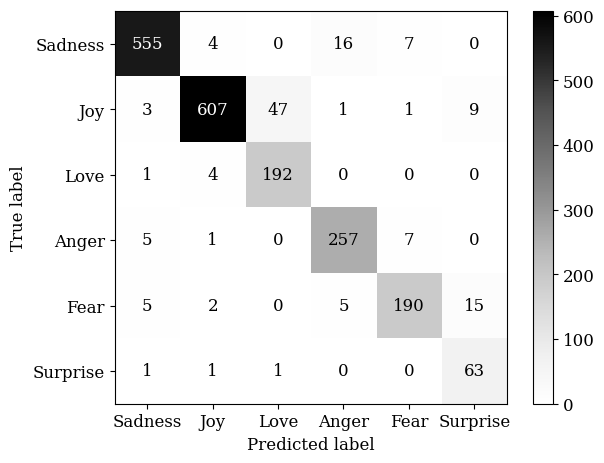

In [ ]:
# More fitting font etc.
plt.rcParams.update({
    "font.family": "serif",
    "font.serif": ["DejaVu Serif"],
    "font.size": 12
})

ConfusionMatrixDisplay(confusion_matrix(emotion_dataset["test"].with_format("numpy")["label"], np.argmax(test_set_predictions, axis=1)), display_labels=dict([(value.capitalize(), key) for key, value in task_definitions["emotion"]["labels"].items()])).plot(cmap="Greys")

plt.tight_layout()

plt.savefig("confusion_matrix.pdf")
plt.show()

In [ ]:
# Visualization of the embeddings produced by the final model
mean_last_hidden_states = np.empty(shape=(0,768))
labels_numpy = emotion_dataset["test"].with_format("numpy")["label"][:1000]

# Limit the samples to half the size to keep the plot more readable
for batch in range(int(len(emotion_dataset["test"]) / 2 / 100)):
  range_start = batch * 100
  range_end = batch * 100 + 100

  with torch.no_grad():
    batch_last_hidden_states = model(**emotion_dataset["test"][range_start:range_end], return_dict=True, output_hidden_states=True)["last_hidden_state"]

    input_mask_expanded = emotion_dataset["test"][range_start:range_end]["attention_mask"].unsqueeze(-1).expand(batch_last_hidden_states.size()).float()
    mean_embeddings = torch.sum(batch_last_hidden_states * input_mask_expanded, 1) / torch.clamp(input_mask_expanded.sum(1), min=1e-9)

    mean_last_hidden_states = np.concatenate((mean_last_hidden_states, mean_embeddings.detach().cpu().numpy()), axis=0)

print(mean_last_hidden_states.shape)

(1000, 768)


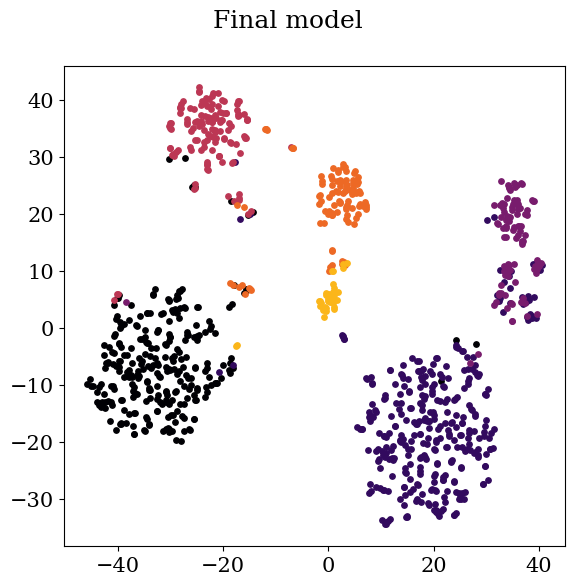

In [ ]:
pca = PCA(n_components=50)

pca_mean_embeddings_pca = pca.fit_transform(mean_last_hidden_states)

t_sne = TSNE(n_components=2)

pca_mean_embeddings_t_sne = t_sne.fit_transform(pca_mean_embeddings_pca)

fig = plt.figure(figsize=(6, 6))
ax = fig.add_subplot()

plt.rcParams.update({
    "font.family": "serif",
    "font.serif": ["DejaVu Serif"],
    "font.size": 15
})

markers = ["o", "s", "*", "v", "D", "p"]
colors = plt.get_cmap("inferno")(np.linspace(0, 1, 7)[:6])

fig.suptitle("Final model")

for label_index, color, marker in zip(range(len(task_definitions["emotion"]["labels"].keys())), colors, markers):
  sample_indexes = [i for i, x in enumerate(labels_numpy) if x == label_index]

  label = task_definitions["emotion"]["labels"][label_index].capitalize()

  ax.scatter(pca_mean_embeddings_t_sne[sample_indexes, 0], pca_mean_embeddings_t_sne[sample_indexes, 1], s=15, color=color, label=label)

plt.tight_layout()

plt.savefig("intra_dataset_final_model_embeddings.pdf")

plt.show()


In [17]:
# Calculate metrics for the unseen sample sets for statistical significance testing and comparison
unseen_test_metrics = {
    "macro_f1": [],
    "weighted_f1": [],
    "accuracy": []
}
unseen_test_set_macro_f1 = []
unseen_test_set_weighted_f1 = []
unseen_test_set_accuracy = []

for unseen_test_set_index in range(int(50000 / 2000)):
  subset_range = range(2000 * unseen_test_set_index, 2000 * (unseen_test_set_index + 1))
  subset = emotion_dataset_unseen.select(subset_range)

  predictions = trainer.predict(subset)[0]
  labels = subset.with_format("numpy")["label"]

  unseen_test_metrics["macro_f1"].append(f1_score(labels, np.argmax(predictions, axis=-1), average="macro"))
  unseen_test_metrics["weighted_f1"].append(f1_score(labels, np.argmax(predictions, axis=-1), average="weighted"))
  unseen_test_metrics["accuracy"].append(accuracy_score(labels, np.argmax(predictions, axis=-1)))

for metric_name, values in unseen_test_metrics.items():
  print(f"Mean {metric_name}: {sum(values) / len(values)}")
  print(f"All {metric_name} values: {values}")

Warning! Missing distillation loss targets for emotion, OK for just emotion detection evaluation NOT OK for training


Mean macro_f1: 0.9026145003782463
All macro_f1 values: [0.9107869642756982, 0.9002770534263544, 0.9040018133744007, 0.8993801173310728, 0.900221368028463, 0.8928458359487875, 0.9037357759647352, 0.9005827714655353, 0.9034405989960469, 0.8954586732659164, 0.9076987884221714, 0.9015368088227227, 0.9158633870193365, 0.8931664437904775, 0.9111613536913957, 0.8960177258105954, 0.8860093205686704, 0.899472499039471, 0.9095493448361265, 0.9017587194025384, 0.9091534305186052, 0.9076265306815605, 0.9029044293787661, 0.8949604806115384, 0.9177522747851711]
Mean weighted_f1: 0.93132587631674
All weighted_f1 values: [0.9335096108000306, 0.9312139828073965, 0.9324675831795203, 0.9373809027009128, 0.9343026466184733, 0.9265035974247314, 0.9321973249003069, 0.927554361387598, 0.9330312016273435, 0.923493639547996, 0.9337712787917759, 0.9307665402715029, 0.9380935969946606, 0.92914207167644, 0.9349967982007221, 0.9251655019761775, 0.926215322989903, 0.923689629726022, 0.9350333189767452, 0.9313660089

# Statistical significance testing

Finally the statistical significance testing of between the baseline and final models is done. The conformity to the normal distribution is also calculated for the macro F1 scores. The paired T-test was selected to be used in the thesis, but p-value for the Wilcoxon signed rank test was also calculated just in case it was needed.

In [18]:
# Macro F1 metrics of unsees test datasets, where at each index has is for a separate test dataset
baseline_macro_f1_metrics = [0.8901908303448115, 0.9041255305644397, 0.8866659303156545, 0.8778461789610499, 0.8933114767686964, 0.8982536372619032, 0.892897178680477, 0.8861323901906841, 0.8848415003046971, 0.8849754355763326, 0.8977356824717343, 0.8965353745999652, 0.8864821461587155, 0.8999334219737181, 0.8954630344894844, 0.8803189409669264, 0.8993583034733043, 0.8773820402197702, 0.8882329482776107, 0.8921379097826687, 0.8884501040884812, 0.8945247647779869, 0.8880074725875035, 0.8866071433242072, 0.8964122481880815]
final_macro_f1_metrics = [0.9107869642756982, 0.9002770534263544, 0.9040018133744007, 0.8993801173310728, 0.900221368028463, 0.8928458359487875, 0.9037357759647352, 0.9005827714655353, 0.9034405989960469, 0.8954586732659164, 0.9076987884221714, 0.9015368088227227, 0.9158633870193365, 0.8931664437904775, 0.9111613536913957, 0.8960177258105954, 0.8860093205686704, 0.899472499039471, 0.9095493448361265, 0.9017587194025384, 0.9091534305186052, 0.9076265306815605, 0.9029044293787661, 0.8949604806115384, 0.9177522747851711]

print(f"Baseline mean macro F1: {sum(baseline_macro_f1_metrics) / len(baseline_macro_f1_metrics)}")
print(f"Final mean macro F1: {sum(final_macro_f1_metrics) / len(final_macro_f1_metrics)}", end="\n\n")

print(f"Difference in mean macro F1: {(sum(final_macro_f1_metrics) / len(final_macro_f1_metrics)) - (sum(baseline_macro_f1_metrics) / len(baseline_macro_f1_metrics))}", end="\n\n")

print(f"Normal distribution baseline: {normaltest(baseline_macro_f1_metrics).pvalue}")
print(f"Normal distribution final: {normaltest(final_macro_f1_metrics).pvalue}", end="\n\n")

print(f"wilcoxon: {wilcoxon(final_macro_f1_metrics, baseline_macro_f1_metrics, alternative="greater")}")
print(f"paired t-test: {ttest_rel(final_macro_f1_metrics, baseline_macro_f1_metrics, alternative="greater")}")

Baseline mean macro F1: 0.8906728649739561
Final mean macro F1: 0.9026145003782463

Difference in mean macro F1: 0.011941635404290163

Normal distribution baseline: 0.8213025865548989
Normal distribution final: 0.9680242119536341

wilcoxon: WilcoxonResult(statistic=np.float64(305.0), pvalue=np.float64(1.1056661605834961e-05))
paired t-test: TtestResult(statistic=np.float64(5.7542869675422095), pvalue=np.float64(3.1265286803162862e-06), df=np.int64(24))
